# 1. Setup

## Environment

In [1]:
!python --version

Python 3.12.12


In [2]:
!nvidia-smi

Wed Mar 18 13:05:44 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.08             Driver Version: 580.105.08     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!lscpu

Architecture:                x86_64
  CPU op-mode(s):            32-bit, 64-bit
  Address sizes:             46 bits physical, 48 bits virtual
  Byte Order:                Little Endian
CPU(s):                      4
  On-line CPU(s) list:       0-3
Vendor ID:                   GenuineIntel
  Model name:                Intel(R) Xeon(R) CPU @ 2.00GHz
    CPU family:              6
    Model:                   85
    Thread(s) per core:      2
    Core(s) per socket:      2
    Socket(s):               1
    Stepping:                3
    BogoMIPS:                4000.31
    Flags:                   fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pg
                             e mca cmov pat pse36 clflush mmx fxsr sse sse2 ss h
                             t syscall nx pdpe1gb rdtscp lm constant_tsc rep_goo
                             d nopl xtopology nonstop_tsc cpuid tsc_known_freq p
                             ni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2ap
                   

In [4]:
!free -h

               total        used        free      shared  buff/cache   available
Mem:            31Gi       665Mi        28Gi       1.0Mi       2.6Gi        30Gi
Swap:             0B          0B          0B


In [5]:
!cat /etc/os-release

PRETTY_NAME="Ubuntu 22.04.4 LTS"
NAME="Ubuntu"
VERSION_ID="22.04"
VERSION="22.04.4 LTS (Jammy Jellyfish)"
VERSION_CODENAME=jammy
ID=ubuntu
ID_LIKE=debian
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
UBUNTU_CODENAME=jammy


In [6]:
!df -h

Filesystem                                                              Size  Used Avail Use% Mounted on
overlay                                                                 7.9T  6.6T  1.3T  84% /
tmpfs                                                                    64M     0   64M   0% /dev
shm                                                                      14G     0   14G   0% /dev/shm
/dev/sda1                                                               122G  3.5G  119G   3% /opt/bin
/dev/loop1                                                               20G  444K   20G   1% /kaggle/lib
192.168.5.2:/data/kagglesdsdata/models/603958/791330/dh5x7ds3ghut       100T   86T   15T  86% /kaggle/input/models/angelogoes/patch-tau-study/pytorch/default/1
192.168.5.2:/data/kagglesdsdata/models/591828/787830/dh5x7ds3kbz1       100T   86T   15T  86% /kaggle/input/models/angelogoes/tilda-models/pytorch/default/2
192.168.5.2:/data/kagglesdsdata/datasets/9761205/15258346/dh5x7ds2g7wn 

## Libraries

In [7]:
# ==========================================
# 1. INSTALLS & SETUP
# ==========================================
# !pip install torch-tensorrt -q
# !pip install -q onnx==1.16.1 onnxruntime-gpu onnxscript

import warnings
warnings.filterwarnings('ignore')

# ==========================================
# 2. STANDARD LIBRARIES
# ==========================================
import os
import gc
import re
import time
import copy
import json
import shutil
import random
from tqdm.auto import tqdm
from glob import glob
from datetime import datetime
from collections import defaultdict

# ==========================================
# 3. DATA & VISUALIZATION
# ==========================================
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageDraw
import zipfile

plt.style.use('seaborn-v0_8-whitegrid')
%matplotlib inline

# ==========================================
# 4. MACHINE LEARNING & METRICS (Scikit-Learn)
# ==========================================
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, 
    recall_score, roc_auc_score, confusion_matrix,
    precision_recall_fscore_support
)

# ==========================================
# 5. DEEP LEARNING (PyTorch & timm)
# ==========================================
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.cuda.amp import autocast, GradScaler
import timm
# import onnx
# import onnxruntime as ort

In [8]:
!pip freeze > requirements.txt

## Constants

In [9]:
# ==========================================
# MASTER CONFIGURATION
# ==========================================
class CFG:
    DATASET = "HKU" # ['TILDA', 'HKU']
    BATCH_SIZE = 64
    LEARNING_RATE = 1e-4
    WEIGHT_DECAY = 0.05
    
    SEED = 42
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    NUM_WORKERS = 4
    
    PATCH_DIR = "/kaggle/working/patches"
    PATCH_SIZE = [64]
    N_IMAGES = 4

    DATASETS_INFO = {
        "TILDA": {
            "root": "/kaggle/input/datasets/angelolmg/tilda-400",
            "patch_sizes": PATCH_SIZE,
            "tolerance": 0.05,
            "clamp": 0.1,
            "classes": {
                0: "hole", 1: "foreign_objects", 2: "oil_spot", 3: "thread_error"
            },
            "colors": {
                "good": (0, 155, 0), "hole": (255, 0, 0), 
                "foreign_objects": (0, 0, 255), "oil_spot": (255, 165, 0), 
                "thread_error": (128, 0, 128)
            }
        },
        "HKU": {
            "root": "/kaggle/input/datasets/angelogoes/hku-dataset",
            "patch_sizes": PATCH_SIZE,
            "tolerance": 0.05,
            "clamp": 0.1,
            "classes": {
                0: "BrokenEnd", 1: "Hole", 2: "NettingMultiple", 
                3: "ThickBar", 4: "ThinBar", 5: "Knots"
            },
            "colors": {
                "good": (0, 155, 0), "BrokenEnd": (255, 0, 0), 
                "Hole": (0, 0, 255), "NettingMultiple": (255, 165, 0), 
                "ThickBar": (128, 0, 128), "ThinBar": (0, 255, 255), "Knots": (255, 255, 0)
            }
        }
    }

    @classmethod
    def get_active_info(cls):
        return cls.DATASETS_INFO[cls.DATASET]

active_data = CFG.get_active_info()

print(f"[INFO] DATASET: {CFG.DATASET}")
print(f"[INFO] ROOT: {active_data['root']}")
print(f"[INFO] CLASSES: {list(active_data['classes'].values())}")
print(f"[INFO] DEVICE: {CFG.DEVICE.upper()}")

[INFO] DATASET: HKU
[INFO] ROOT: /kaggle/input/datasets/angelogoes/hku-dataset
[INFO] CLASSES: ['BrokenEnd', 'Hole', 'NettingMultiple', 'ThickBar', 'ThinBar', 'Knots']
[INFO] DEVICE: CUDA


## Seed

In [10]:
def set_seed(seed: int = 42) -> None:
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    # Set seed for PyTorch
    torch.manual_seed(seed)
    # Set seed for CUDA (if using GPUs)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # For multi-GPU setups
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set seed for Python's random module
    random.seed(seed)
    # Set seed for NumPy
    np.random.seed(seed)
    #tf.random.set_seed(seed) # set random seed for TensorFlow
    print(f"[INFO] Random seed set as {seed}")

set_seed(CFG.SEED)

[INFO] Random seed set as 42


# 2. Dataset

## Patch extraction

In [11]:
SOURCE_IMG_DIR = "./source/images"
SOURCE_MSK_DIR = "./source/masks"
SOURCE_AREA_DIR = "./source/areas"

def _setup_source_dirs():
    os.makedirs(SOURCE_IMG_DIR, exist_ok=True)
    os.makedirs(SOURCE_MSK_DIR, exist_ok=True)
    os.makedirs(SOURCE_AREA_DIR, exist_ok=True)

def _extract_patches_tilda():
    _setup_source_dirs()
    img_dir = os.path.join(active_data['root'], "images")
    lbl_dir = os.path.join(active_data['root'], "labels")
    msk_dir = os.path.join(active_data['root'], "masks")

    os.makedirs(CFG.PATCH_DIR, exist_ok=True)
    image_paths = sorted(glob(os.path.join(img_dir, "*.tif")))

    patch_counts = {
        res: {cname: 0 for cname in list(active_data['classes'].values()) + ["good"]}
        for res in active_data['patch_sizes']
    }
    
    iou_scores = {res: [] for res in active_data['patch_sizes']}

    for img_path in image_paths:
        base = os.path.splitext(os.path.basename(img_path))[0]
        lbl_path = os.path.join(lbl_dir, base + ".txt")
        msk_path = os.path.join(msk_dir, base + ".png")

        if not os.path.exists(lbl_path) or not os.path.exists(msk_path):
            continue

        image = np.array(Image.open(img_path))
        mask = np.array(Image.open(msk_path))
        if mask.ndim == 3: mask = mask[:, :, 0]

        Image.fromarray(image).save(os.path.join(SOURCE_IMG_DIR, f"{base}.tif"))
        Image.fromarray(mask).save(os.path.join(SOURCE_MSK_DIR, f"{base}.png"))

        total_defect_pixels = np.count_nonzero(mask)

        # Read class from YOLO TXT
        with open(lbl_path, "r") as f:
            lines = f.readlines()
            
        if len(lines) == 0:
            class_name = "good"
        else:
            first_class_idx = int(lines[0].split()[0])
            class_name = active_data['classes'].get(first_class_idx, "good")

        required_dynamic = int(total_defect_pixels * active_data['tolerance'])
        if required_dynamic == 0 and total_defect_pixels > 0: required_dynamic = 1

        for res in active_data['patch_sizes']:
            res_dir = os.path.join(CFG.PATCH_DIR, str(res))
            
            # Make sure the specific resolution folder exists in our areas directory
            os.makedirs(os.path.join(SOURCE_AREA_DIR, str(res)), exist_ok=True)
            
            for cname in list(active_data['classes'].values()) + ["good"]:
                os.makedirs(os.path.join(res_dir, cname), exist_ok=True)

            patch_area = res * res
            max_pixels_clamp = int(patch_area * active_data['clamp'])
            final_threshold = min(required_dynamic, max_pixels_clamp)
            if total_defect_pixels > 0 and final_threshold < 1: final_threshold = 1

            h, w = mask.shape
            
            reconstructed_mask = np.zeros_like(mask, dtype=bool)

            for i in range(h // res):
                for j in range(w // res):
                    y, x = i * res, j * res
                    p_img = image[y:y+res, x:x+res]
                    p_mask = mask[y:y+res, x:x+res]
                    
                    if np.count_nonzero(p_mask) >= final_threshold and total_defect_pixels > 0:
                        save_class = class_name
                        reconstructed_mask[y:y+res, x:x+res] = True
                    else:
                        save_class = "good"

                    save_path = os.path.join(res_dir, save_class, f"{base}_patch{i}_{j}.tif")
                    Image.fromarray(p_img).save(save_path)
                    patch_counts[res][save_class] += 1
            
            # --- Save the blocky reconstructed mask ---
            # Convert boolean (True/False) to uint8 (255/0) for saving
            save_mask = (reconstructed_mask.astype(np.uint8) * 255)
            Image.fromarray(save_mask).save(os.path.join(SOURCE_AREA_DIR, str(res), f"{base}.png"))
            
            # Calculate IoU for this image (only if it actually has defects)
            if total_defect_pixels > 0:
                original_bool_mask = mask > 0
                intersection = np.logical_and(original_bool_mask, reconstructed_mask).sum()
                union = np.logical_or(original_bool_mask, reconstructed_mask).sum()
                iou = intersection / union if union > 0 else 0.0
                iou_scores[res].append(iou)

    mean_ious = {res: (np.mean(scores) if scores else 0.0) for res, scores in iou_scores.items()}
    return patch_counts, mean_ious


def _extract_patches_hku():
    _setup_source_dirs()
    os.makedirs(CFG.PATCH_DIR, exist_ok=True)
    
    patch_counts = {
        res: {cname: 0 for cname in list(active_data['classes'].values()) + ["good"]}
        for res in active_data['patch_sizes']
    }
    
    iou_scores = {res: [] for res in active_data['patch_sizes']}
    
    pattern_folders = [
        "box-patterned-fabric_with_groundtruth",
        "dot-patterned_fabric_with_groundtruth",
        "star-patterned fabric_with_groundtruth" 
    ]

    for pattern in pattern_folders:
        pattern_path = os.path.join(active_data['root'], pattern)
        if not os.path.exists(pattern_path): continue

        for class_folder in os.listdir(pattern_path):
            class_path = os.path.join(pattern_path, class_folder)
            if not os.path.isdir(class_path): continue

            class_name = "good" if class_folder == "Reference" else class_folder
            
            all_bmps = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.lower().endswith('.bmp')]
            image_paths = [p for p in all_bmps if not os.path.basename(p).startswith("groundT_")]

            for img_path in image_paths:
                base_name = os.path.basename(img_path)
                msk_name = f"groundT_{base_name}"
                msk_path = os.path.join(class_path, msk_name)

                image = np.array(Image.open(img_path))
                
                if class_name != "good" and os.path.exists(msk_path):
                    mask = np.array(Image.open(msk_path))
                else:
                    mask = np.zeros(image.shape[:2], dtype=np.uint8)

                if mask.ndim == 3: mask = mask[:, :, 0]
                
                base_no_ext = os.path.splitext(base_name)[0]

                Image.fromarray(image).save(os.path.join(SOURCE_IMG_DIR, f"{base_no_ext}.tif"))
                Image.fromarray(mask).save(os.path.join(SOURCE_MSK_DIR, f"{base_no_ext}.png"))

                total_defect_pixels = np.count_nonzero(mask)

                required_dynamic = int(total_defect_pixels * active_data['tolerance'])
                if required_dynamic == 0 and total_defect_pixels > 0: required_dynamic = 1

                for res in active_data['patch_sizes']:
                    res_dir = os.path.join(CFG.PATCH_DIR, str(res))
                    
                    # Make sure the specific resolution folder exists in our areas directory
                    os.makedirs(os.path.join(SOURCE_AREA_DIR, str(res)), exist_ok=True)
                    
                    for cname in list(active_data['classes'].values()) + ["good"]:
                        os.makedirs(os.path.join(res_dir, cname), exist_ok=True)

                    patch_area = res * res
                    max_pixels_clamp = int(patch_area * active_data['clamp'])
                    final_threshold = min(required_dynamic, max_pixels_clamp)
                    if total_defect_pixels > 0 and final_threshold < 1: final_threshold = 1

                    h, w = mask.shape
                    
                    reconstructed_mask = np.zeros_like(mask, dtype=bool)
                        
                    for i in range(h // res):
                        for j in range(w // res):
                            y, x = i * res, j * res
                            p_img = image[y:y+res, x:x+res]
                            p_mask = mask[y:y+res, x:x+res]

                            if np.count_nonzero(p_mask) >= final_threshold and total_defect_pixels > 0:
                                save_class = class_name
                                reconstructed_mask[y:y+res, x:x+res] = True
                            else:
                                save_class = "good"

                            save_path = os.path.join(res_dir, save_class, f"{base_no_ext}_patch{i}_{j}.tif")
                            Image.fromarray(p_img).save(save_path)
                            patch_counts[res][save_class] += 1
                    
                    # --- NEW: Save the blocky reconstructed mask ---
                    # Convert boolean (True/False) to uint8 (255/0) for saving
                    save_mask = (reconstructed_mask.astype(np.uint8) * 255)
                    Image.fromarray(save_mask).save(os.path.join(SOURCE_AREA_DIR, str(res), f"{base_no_ext}.png"))
                            
                    # Calculate IoU for this image (only if it actually has defects)
                    if total_defect_pixels > 0:
                        original_bool_mask = mask > 0
                        intersection = np.logical_and(original_bool_mask, reconstructed_mask).sum()
                        union = np.logical_or(original_bool_mask, reconstructed_mask).sum()
                        iou = intersection / union if union > 0 else 0.0
                        iou_scores[res].append(iou)

    # Calculate mean IoU for each resolution
    mean_ious = {res: (np.mean(scores) if scores else 0.0) for res, scores in iou_scores.items()}
    return patch_counts, mean_ious

# --- ROUTER ---
def extract_patches():
    print(f"Extracting patches for dataset {CFG.DATASET}...")
    if CFG.DATASET == "TILDA":
        return _extract_patches_tilda()
    elif CFG.DATASET == "HKU":
        return _extract_patches_hku()
    else:
        raise ValueError("Dataset not supported.")

# ==========================
# ===== METADATA & ZIP =====
# ==========================

def save_metadata(patch_counts, mean_ious):
    meta_path = os.path.join(CFG.PATCH_DIR, "metadata.txt")

    with open(meta_path, "w") as f:
        f.write(f"Patch Extraction Metadata - {CFG.DATASET}\n")
        f.write("==========================\n")
        f.write(f"Date: {datetime.now()}\n")
        f.write(f"Dataset root: {active_data['root']}\n")
        f.write(f"Patch sizes: {active_data['patch_sizes']}\n")
        f.write(f"Tolerance: {active_data['tolerance']} ({active_data['tolerance']*100}%)\n")
        f.write(f"Clamp: {active_data['clamp']} ({active_data['clamp']*100}%)\n\n")

        f.write("Class mapping:\n")
        for k, v in active_data['classes'].items():
            f.write(f"  {k}: {v}\n")
            
        f.write("\nMean IoU (Reconstructed vs Original Mask for Defective Images):\n")
        for res in active_data['patch_sizes']:
            f.write(f"  Resolution {res}x{res}: {mean_ious[res]:.4f}\n")

        f.write("\nPatch Counts:\n")
        for res in active_data['patch_sizes']:
            f.write(f"\nResolution {res}x{res}:\n")
            for cname, count in patch_counts[res].items():
                f.write(f"  {cname}: {count}\n")

    print(f"\nMetadata saved in {meta_path}.")
    
    print("\n--- Mean IoU per Patch Size ---")
    for res in active_data['patch_sizes']:
        print(f"  > {res}x{res}: {mean_ious[res]:.4f}")

def zip_output_folder(folder_path):
    zip_name = f"{CFG.DATASET}_{os.path.basename(os.path.abspath(folder_path))}.zip"
    zip_path = os.path.join(os.getcwd(), zip_name)

    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                abs_path = os.path.join(root, file)
                rel_path = os.path.relpath(abs_path, folder_path)
                zf.write(abs_path, arcname=rel_path)

    print(f"ZIP created at: {zip_path}")
    return zip_path

In [12]:
set_seed(CFG.SEED)

patch_counts, mean_ious = extract_patches()
save_metadata(patch_counts, mean_ious)
# zip_output_folder(CFG.PATCH_DIR)

print("Patch extraction complete.")

[INFO] Random seed set as 42
Extracting patches for dataset HKU...

Metadata saved in /kaggle/working/patches/metadata.txt.

--- Mean IoU per Patch Size ---
  > 64x64: 0.1208
Patch extraction complete.


In [13]:
# ==========================
# ===== CLENUP FILES ======
# ==========================

# PATCH_FOLDER = OUTPUT_DIR
# ZIP_FILE = os.path.basename(os.path.abspath(OUTPUT_DIR)) + ".zip"
# ZIP_PATH = os.path.join(os.getcwd(), ZIP_FILE)

# # Delete patches folder
# if os.path.exists(PATCH_FOLDER):
#     shutil.rmtree(PATCH_FOLDER)
#     print(f"Deleted folder: {PATCH_FOLDER}")
# else:
#     print("Patch folder not found.")

# # Delete zip file
# if os.path.exists(ZIP_PATH):
#     os.remove(ZIP_PATH)
#     print(f"Deleted zip file: {ZIP_PATH}")
# else:
#     print("Zip file not found.")

# print("Cleanup complete.")

## Visualization

In [14]:
def visualize_dataset(current_patch_size, current_base_path):
    print(f"\n{'='*60}")
    print(f"=== RUNNING EDA FOR PATCH SIZE: {current_patch_size}x{current_patch_size} ===")
    print(f"{'='*60}")

    if not os.path.exists(current_base_path):
        print(f"⚠️ Warning: Directory {current_base_path} not found. Skipping...")
        return

    CLASS_NAMES = sorted([
        d for d in os.listdir(current_base_path)
        if os.path.isdir(os.path.join(current_base_path, d))
    ])
    CLASS_COUNT = len(CLASS_NAMES)
    
    if CLASS_COUNT == 0:
        print(f"⚠️ No classes found in {current_base_path}. Skipping...")
        return

    TITLE_SIZE = 14
    LABEL_SIZE = 12
    TICK_SIZE = 10

    # ==========================
    # ===== PATCH DISTRIBUTION =
    # ==========================
    print(f"Reading patches from: {current_base_path}...")

    image_paths, labels = [], []
    class_counts = {}

    for class_name in CLASS_NAMES:
        class_dir = os.path.join(current_base_path, class_name)
        paths = glob(os.path.join(class_dir, "*.tif"))
        
        image_paths.extend(paths)
        labels.extend([class_name] * len(paths))
        class_counts[class_name] = len(paths)

    df_eda = pd.DataFrame({"image_path": image_paths, "label": labels})
    print(f"Total patches found ({current_patch_size}x{current_patch_size}): {len(df_eda)}")

    if len(df_eda) == 0:
        print("⚠️ No images found. Skipping visualization for this patch size.")
        return

    sorted_classes = sorted(class_counts, key=class_counts.get, reverse=True)
    sorted_counts = [class_counts[c] for c in sorted_classes]

    def normalize_color(color):
        if isinstance(color, tuple):
            if max(color) > 1: return tuple(c / 255 for c in color)
        return color

    active_colors = active_data['colors']
    sorted_colors = [normalize_color(active_colors.get(c, (0,0,0))) for c in sorted_classes]

    # Plot Distribution
    plt.figure(figsize=(12, 6))
    bars = plt.bar(sorted_classes, sorted_counts, color=sorted_colors)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f"{int(height)}", 
                 ha="center", va="bottom", fontsize=TICK_SIZE)

    plt.title(f"Patch Class Distribution - {CFG.DATASET} ({current_patch_size}x{current_patch_size})", fontsize=TITLE_SIZE)
    plt.xlabel("Class", fontsize=LABEL_SIZE)
    plt.ylabel("Number of Patches", fontsize=LABEL_SIZE)
    plt.xticks(rotation=45, fontsize=TICK_SIZE)
    plt.yticks(fontsize=TICK_SIZE)
    plt.tight_layout()
    plt.show()

    # ==========================
    # ===== SAMPLE PATCHES =====
    # ==========================
    fig, axes = plt.subplots(2, CLASS_COUNT, figsize=(CLASS_COUNT * 4, 8))
    fig.suptitle(f"Example Patches per Class - {CFG.DATASET} ({current_patch_size}x{current_patch_size})", fontsize=TITLE_SIZE)

    # Handle case where there is only 1 class (axes is 1D instead of 2D)
    if CLASS_COUNT == 1:
        axes = axes.reshape(2, 1)

    for i, class_name in enumerate(CLASS_NAMES):
        class_df = df_eda[df_eda["label"] == class_name]
        if len(class_df) < 2: 
            print(f"Not enough samples to show for {class_name}")
            continue
        
        sample_paths = class_df["image_path"].sample(2, random_state=CFG.SEED).values
        for row in range(2):
            img = Image.open(sample_paths[row])
            axes[row, i].imshow(img)
            axes[row, i].axis("off")
        axes[0, i].set_title(class_name, fontsize=TITLE_SIZE)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # ==========================
    # ===== RECONSTRUCTION =====
    # ==========================
    def reconstruct_image(base_name, p_size, b_path):
        """Reconstruct a full image from its patches and highlight defective regions."""
        patch_map = []
        max_i, max_j = 0, 0
        defect_counts = {cls: 0 for cls in CLASS_NAMES if cls != "good"}
        total_patches = 0

        for class_name in CLASS_NAMES:
            class_dir = os.path.join(b_path, class_name)
            patches = glob(os.path.join(class_dir, f"{base_name}_patch*.tif"))

            for p in patches:
                name = os.path.basename(p)
                # Parse coordinates correctly
                coords = name.replace(f"{base_name}_patch", "").replace(".tif", "")
                try:
                    i, j = map(int, coords.split("_"))
                except ValueError:
                    continue # Skip if naming convention is broken

                patch_map.append((i, j, class_name, p))
                max_i = max(max_i, i)
                max_j = max(max_j, j)
                total_patches += 1

                if class_name != "good":
                    defect_counts[class_name] += 1

        if total_patches == 0:
            return None

        H = (max_i + 1) * p_size
        W = (max_j + 1) * p_size
        canvas = Image.new("RGB", (W, H))
        draw = ImageDraw.Draw(canvas)

        for i, j, class_name, path in patch_map:
            try:
                patch = Image.open(path)
                x, y = j * p_size, i * p_size
                canvas.paste(patch, (x, y))

                if class_name != "good":
                    draw.rectangle(
                        [x, y, x + p_size, y + p_size],
                        outline=active_data['colors'].get(class_name, (255,0,0)), width=3
                    )
            except Exception as e:
                pass # Ignore broken images

        draw.text((8, 6), base_name, fill=(255, 255, 255))

        defect_total = sum(defect_counts.values())
        defect_ratio = defect_total / total_patches if total_patches > 0 else 0
        stats_lines = [
            f"Total patches: {total_patches}",
            f"Defective: {defect_total} ({defect_ratio:.2%})"
        ]
        for cls, count in defect_counts.items():
            if count > 0: stats_lines.append(f"{cls}: {count}")

        stats_text = "\n".join(stats_lines)
        text_x, text_y = 10, 40
        draw.multiline_text((text_x, text_y), stats_text, fill=(255, 255, 255))

        return canvas

    # ---- Random reconstruction (Only images with defects) ----
    defective_patch_files = []
    for class_name in CLASS_NAMES:
        if class_name != "good":
            class_dir = os.path.join(current_base_path, class_name)
            defective_patch_files.extend(glob(os.path.join(class_dir, "*.tif")))

    # Extract base names
    base_names_with_defects = list(set([
        os.path.basename(p).split("_patch")[0]
        for p in defective_patch_files
    ]))

    if not base_names_with_defects:
        print("No defect image found for reconstruction in this patch size.")
    else:
        random.seed(CFG.SEED)
        selected = random.sample(
            base_names_with_defects, 
            min(CFG.N_IMAGES, len(base_names_with_defects))
        )

        plt.figure(figsize=(5 * len(selected), 5))
        valid_plots = 0
        
        for idx, base in enumerate(selected):
            img = reconstruct_image(base, current_patch_size, current_base_path)
            if img:
                plt.subplot(1, len(selected), valid_plots + 1)
                plt.imshow(img)
                plt.axis("off")
                valid_plots += 1

        if valid_plots > 0:
            plt.suptitle(
                f"Reconstructed Defective Images ({CFG.DATASET} - {current_patch_size}x{current_patch_size})",
                fontsize=TITLE_SIZE
            )
            plt.tight_layout()
            plt.show()
        else:
            plt.close()


=== RUNNING EDA FOR PATCH SIZE: 64x64 ===
Reading patches from: /kaggle/working/patches/64...
Total patches found (64x64): 2656


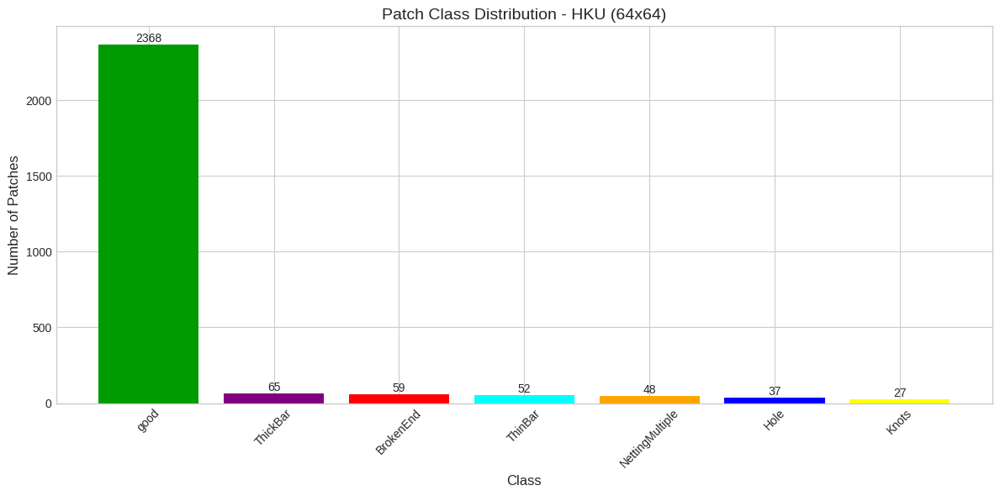

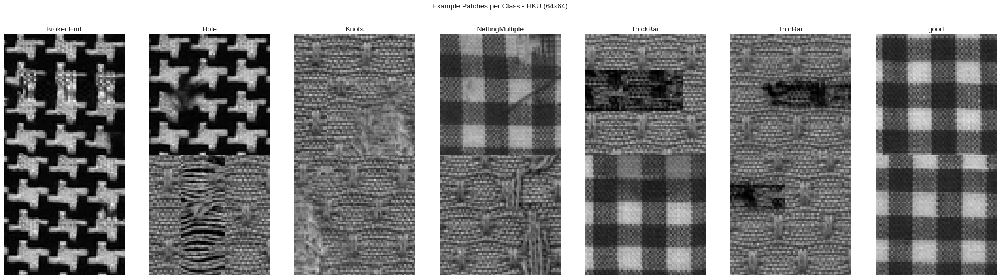

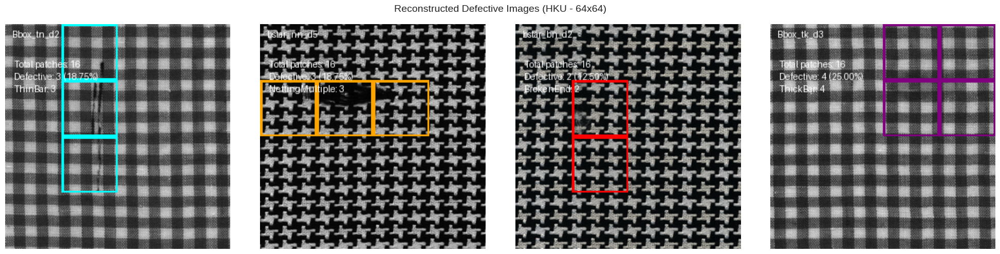

In [15]:
for p_size in CFG.PATCH_SIZE:
    dynamic_path = os.path.join(CFG.PATCH_DIR, str(p_size))
    visualize_dataset(current_patch_size=p_size, current_base_path=dynamic_path)

## Data splitting

In [16]:
# ==========================================
# DATA SPLITTING (STRATIFIED GROUP K-FOLD)
# ==========================================

# 1. Settings and Active Classes
CURRENT_CLASSES = ["good"] + list(active_data['classes'].values())

# We iterate over every patch size specified in your config
for p_size in CFG.PATCH_SIZE:
    print(f"\n{'='*60}")
    print(f"=== GENERATING SPLITS FOR PATCH SIZE: {p_size}x{p_size} ===")
    print(f"{'='*60}")
    
    # Dynamic paths for this specific resolution
    current_patch_dir = os.path.join(CFG.PATCH_DIR, str(p_size))
    current_csv_path = f"/kaggle/working/master_splits_{p_size}.csv"
    
    # Must reset the records list for each resolution!
    dataset_records = []
    
    print(f"[INFO] Scanning dir: {current_patch_dir}")
    print(f"[INFO] Active classes: {CURRENT_CLASSES}")

    # 2. Directory scanning and metadata extraction
    for label in CURRENT_CLASSES:
        class_path = os.path.join(current_patch_dir, label)
        if not os.path.exists(class_path):
            print(f"⚠️ Warning: Directory {class_path} not found.")
            continue
            
        for filename in os.listdir(class_path):
            if filename.lower().endswith((".tif", ".png", ".jpg", ".jpeg", ".bmp")):
                
                # GroupID Extraction: Links patches back to their source image
                group_id = filename.split('_patch')[0]
                
                # Binary Labeling (0: Normal/Good, 1: Defective)
                binary_target = 0 if label == 'good' else 1
                
                dataset_records.append({
                    'filepath': os.path.join(class_path, filename),
                    'filename': filename,
                    'multiclass_label': label,
                    'binary_label': binary_target,
                    'group_id': group_id
                })

    df = pd.DataFrame(dataset_records)
    
    if len(df) == 0:
        print(f"⚠️ No patches found for resolution {p_size}. Skipping...")
        continue
        
    print(f"\n[STAT] Total number of indexed patches: {len(df)}")
    print(f"[STAT] Total number of unique original images (Groups): {df['group_id'].nunique()}")

    # 3. Stratified Group K-Fold Implementation
    print("\nGenerating splits of 5 Folds (Stratified Group K-Fold)...")
    sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=CFG.SEED)

    df['fold'] = -1

    # Divide based on multiclass groups, keeping the source images (groups) together
    for fold_idx, (train_indices, val_indices) in enumerate(sgkf.split(X=df, y=df['multiclass_label'], groups=df['group_id'])):
        df.loc[val_indices, 'fold'] = fold_idx

    # 4. Integrity and Leakage Verification (Sanity Checks)
    print("\n--- Division Statistics (Validation) ---")
    binary_dist = pd.crosstab(df['fold'], df['binary_label'], normalize='index') * 100
    print("Binary distribution by fold (0: Good, 1: Defect):")
    print(binary_dist.round(2).astype(str) + '%')

    print("\n--- Data Leakage Check ---")
    leakage_detected = False
    for i in range(5):
        train_set_groups = set(df[df['fold'] != i]['group_id'])
        val_set_groups = set(df[df['fold'] == i]['group_id'])
        intersection = train_set_groups.intersection(val_set_groups)
        
        if len(intersection) > 0:
            print(f"❌ CRITICAL ERROR: Data leak detected in Fold {i}!")
            print(f"Original images overlapping: {intersection}")
            leakage_detected = True

    if not leakage_detected:
        print("✅ Success: No leak detected. Each source image belongs to a single fold.")

    # ==========================================
    # 4.5. INTEGER MAPPING FOR MULTICLASS TARGET
    # ==========================================
    # Here we force 'good' to be 0, and map the rest sequentially.
    unique_defects = [c for c in df['multiclass_label'].unique() if c != 'good']
    class_to_idx = {'good': 0}

    for i, def_name in enumerate(unique_defects, start=1):
        class_to_idx[def_name] = i

    # Create the new column that PyTorch will use
    df['multi_target'] = df['multiclass_label'].map(class_to_idx)

    print(f"\n[INFO] Multiclass Mapping applied: {class_to_idx}")

    # 5. Exporting Master Metadata
    df.to_csv(current_csv_path, index=False)
    print(f"📁 Metadata of the splits saved in: {current_csv_path}")

print("\nAll splits generated successfully.")


=== GENERATING SPLITS FOR PATCH SIZE: 64x64 ===
[INFO] Scanning dir: /kaggle/working/patches/64
[INFO] Active classes: ['good', 'BrokenEnd', 'Hole', 'NettingMultiple', 'ThickBar', 'ThinBar', 'Knots']

[STAT] Total number of indexed patches: 2656
[STAT] Total number of unique original images (Groups): 166

Generating splits of 5 Folds (Stratified Group K-Fold)...

--- Division Statistics (Validation) ---
Binary distribution by fold (0: Good, 1: Defect):
binary_label       0       1
fold                        
0             88.07%  11.93%
1             90.15%   9.85%
2             88.05%  11.95%
3              89.2%   10.8%
4             90.34%   9.66%

--- Data Leakage Check ---
✅ Success: No leak detected. Each source image belongs to a single fold.

[INFO] Multiclass Mapping applied: {'good': 0, 'BrokenEnd': 1, 'Hole': 2, 'NettingMultiple': 3, 'ThickBar': 4, 'ThinBar': 5, 'Knots': 6}
📁 Metadata of the splits saved in: /kaggle/working/master_splits_64.csv

All splits generated succes

In [17]:
# Helper method
# def delete_folder(path):
#     if os.path.exists(path):
#         shutil.rmtree(path)
#         print(f"Folder '{path}' and its contents deleted successfully.")
#     else:
#         print(f"Folder '{path}' does not exist.")

# delete_folder("/kaggle/working/experiments/undersample_1to1_20260221_2259")

# 3. Training

## Transform & dataset

In [18]:
# ==========================================
# TRANSFORMS & DATASET
# ==========================================

def get_timm_transforms(model, is_training=True):
    """
    Dynamically creates transforms based on model requirements.
    Automatically handles resize, crop, interpolation, and normalization.
    """
    # Resolve the data configuration from the model
    data_config = timm.data.resolve_model_data_config(model)
    
    # Create the transform pipeline
    # For training, this includes advanced augmentations by default
    transform = timm.data.create_transform(
        **data_config, 
        is_training=is_training
    )
    
    # # Extract the input size for logging/tracking
    input_size = data_config.get('input_size', (3, 224, 224))[-1]
    
    print(f"[INFO] Created {'Train' if is_training else 'Eval'} transforms. "
          f"Target size: {input_size}, Interpolation: {data_config['interpolation']}")
          
    return transform, input_size

# ==========================================
# ===== CUSTOM DATASET =====================
# ==========================================

class TextileDataset(Dataset):
    def __init__(self, filepaths, labels, transform=None, target_size=256, cache_to_ram=True):
        self.filepaths = list(filepaths)
        self.labels = list(labels)
        self.transform = transform
        self.target_size = target_size
        self.cache_to_ram = cache_to_ram
        self.cached_images = {}

        if self.cache_to_ram:
            print(f"[INFO] Caching {len(self.filepaths)} images to RAM. Please wait...")
            for idx in tqdm(range(len(self.filepaths))):
                self.cached_images[idx] = self._load_image(idx)
            # print("[INFO] Caching complete. Disk I/O bottleneck eliminated!")

    def _load_image(self, idx):
        path = self.filepaths[idx]
        try:
            # OpenCV is significantly faster than PIL for initial loading
            img = cv2.imread(path)
            if img is None: raise ValueError("Empty image")
            
            # Convert BGR to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Initial resize to save RAM space if the source is big
            # img = cv2.resize(img, (self.target_size, self.target_size))
            
            return img
        except Exception as e:
            # Fallback for broken files
            return np.zeros((self.target_size, self.target_size, 3), dtype=np.uint8)

    def __len__(self):
        return len(self.filepaths)

    def __getitem__(self, idx):
        # 1. Get image from RAM or Disk
        if self.cache_to_ram:
            image = self.cached_images[idx]
        else:
            image = self._load_image(idx)

        # 2. Convert to PIL for the transform pipeline (timm expects PIL)
        image = Image.fromarray(image)

        # 3. Apply transforms
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(self.labels[idx], dtype=torch.long)

# ==========================================
# MODEL INITIALIZATION (timm)
# ==========================================

def get_timm_model(model_name, num_classes, device, pretrained=True):
    """
    Loads any model from the PyTorch Image Models (timm) library.
    Automatically adapts the final classification head for the dataset's number of classes.
    
    Args:
        model_name (str): Name of the model in timm (e.g., 'fastvit_t8', 'resnet50', 'convnext_tiny').
        num_classes (int): Number of target classes for the final layer.
        device (torch.device): Device to send the model to ('cuda' or 'cpu').
        pretrained (bool): Whether to load ImageNet pre-trained weights.
        
    Returns:
        torch.nn.Module: The loaded and adapted PyTorch model.
    """
    print(f"[INFO] Loading timm model: '{model_name}' (Pretrained: {pretrained})...")

    model = timm.create_model(
        model_name, 
        pretrained=pretrained,
        num_classes=num_classes,
        in_chans=3
    )
    
    print(f"[INFO] Successfully initialized {model_name} with {num_classes} output classes.")
    
    return model.to(device)

## pff test

In [19]:
def preload_ground_truth_masks(group_ids, patch_size):
    """Pré-carrega as máscaras GT na RAM para acesso instantâneo durante o Grid Search."""
    print(f"\n[INFO] Pré-carregando máscaras GT para {len(group_ids)} imagens base...")
    masks_cache = {}
    
    SOURCE_MSK_DIR = "./source/masks"
    SOURCE_AREA_DIR = f"./source/areas/{patch_size}"
    
    for gid in group_ids:
        msk_path = os.path.join(SOURCE_MSK_DIR, f"{gid}.png")
        area_path = os.path.join(SOURCE_AREA_DIR, f"{gid}.png")
        
        if not os.path.exists(msk_path) or not os.path.exists(area_path):
            continue
            
        orig_mask = np.array(Image.open(msk_path))
        if orig_mask.ndim == 3: orig_mask = orig_mask[:,:,0]
        orig_bool = orig_mask > 0
        
        area_mask = np.array(Image.open(area_path))
        if area_mask.ndim == 3: area_mask = area_mask[:,:,0]
        area_bool = area_mask > 0
        
        masks_cache[gid] = {
            'orig_bool': orig_bool,
            'area_bool': area_bool,
            'shape': orig_bool.shape # (H, W)
        }
    return masks_cache

def calculate_fast_patch_metrics(y_true, y_pred):
    """
    Calcula uma gama abrangente de métricas rápidas de nível de patch.
    Inclui métricas Multi-classe (Macro, Weighted, Micro) e Binárias (Bom vs Defeito).
    """
    metrics = {}
    
    # ==========================================
    # 1. PREPARAÇÃO: Colapsar para Binário
    # (Assumindo que 0 = Bom, e > 0 = Defeito)
    # ==========================================
    bin_true = (y_true > 0).astype(int)
    bin_pred = (y_pred > 0).astype(int)
    
    # ==========================================
    # 2. MÉTRICAS MULTI-CLASSE
    # ==========================================
    metrics['patch_acc_multi'] = round(accuracy_score(y_true, y_pred), 4)
    
    # Macro
    p_mac, r_mac, f1_mac, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)
    metrics['patch_f1_macro'] = round(f1_mac, 4)
    metrics['patch_pre_macro'] = round(p_mac, 4)
    metrics['patch_rec_macro'] = round(r_mac, 4)
    
    # Weighted
    p_wei, r_wei, f1_wei, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted', zero_division=0)
    metrics['patch_f1_weighted'] = round(f1_wei, 4)
    metrics['patch_pre_weighted'] = round(p_wei, 4)
    metrics['patch_rec_weighted'] = round(r_wei, 4)
    
    # Micro (Para F1, Micro é igual a Acurácia em cenários multi-classe padrão, mas mantemos por consistência)
    _, _, f1_mic, _ = precision_recall_fscore_support(y_true, y_pred, average='micro', zero_division=0)
    metrics['patch_f1_micro'] = round(f1_mic, 4)
    
    # ==========================================
    # 3. MÉTRICAS BINÁRIAS (Bom vs Qualquer Defeito)
    # ==========================================
    metrics['patch_acc_bin'] = round(accuracy_score(bin_true, bin_pred), 4)
    metrics['patch_f1_bin'] = round(f1_score(bin_true, bin_pred, average='binary', zero_division=0), 4)
    metrics['patch_pre_bin'] = round(precision_score(bin_true, bin_pred, average='binary', zero_division=0), 4)
    metrics['patch_rec_bin'] = round(recall_score(bin_true, bin_pred, average='binary', zero_division=0), 4)
    
    return metrics

def calculate_heavy_segmentation_metrics(df_preds, masks_cache, patch_size, device):
    """Reconstrói as máscaras na GPU e calcula IoU, Region F1 e Sensibilidade."""
    pixel_ious, pixel_f1s, region_ious, region_f1s = [], [], [], []
    img_true_labels, img_pred_labels = [], []
    
    grouped = df_preds.groupby('group_id')
    
    for gid, group_df in grouped:
        
        if gid not in masks_cache: 
            continue

        group_df = group_df.sort_values(['y', 'x'])
        
        gt = masks_cache[gid]
        orig_bool, area_bool = gt['orig_bool'], gt['area_bool']
        h, w = gt['shape']
        
        num_h, num_w = h // patch_size, w // patch_size
        preds_bin_array = (group_df['pred'].values > 0)
        
        if len(preds_bin_array) != (num_h * num_w): continue
            
        # Reconstrução Vetorizada
        preds_bin_gpu = torch.tensor(preds_bin_array, dtype=torch.bool, device=device)
        preds_grid = preds_bin_gpu.view(num_h, num_w)  
        scaled_mask_gpu = preds_grid.repeat_interleave(patch_size, dim=0).repeat_interleave(patch_size, dim=1)
        pred_mask = scaled_mask_gpu.cpu().numpy()
        
        # Alarmes (Imagem)
        has_defect_gt = orig_bool.any()
        has_defect_pred = pred_mask.any()
        img_true_labels.append(1 if has_defect_gt else 0)
        img_pred_labels.append(1 if has_defect_pred else 0)
        
        # Segmentação
        def calc_seg(gt_b, pr_b, has_def_gt):
            inter, union = np.logical_and(gt_b, pr_b).sum(), np.logical_or(gt_b, pr_b).sum()
            if union == 0:
                return (1.0 if not has_defect_pred else 0.0), (1.0 if not has_defect_pred else 0.0)
            return inter / union, f1_score(gt_b.flatten(), pr_b.flatten(), zero_division=1.0 if not has_defect_pred and not has_def_gt else 0.0)
            
        p_iou, p_f1 = calc_seg(orig_bool, pred_mask, has_defect_gt)
        r_iou, r_f1 = calc_seg(area_bool, pred_mask, has_defect_gt)
        
        pixel_ious.append(p_iou)
        pixel_f1s.append(p_f1)
        region_ious.append(r_iou)
        region_f1s.append(r_f1)
        
    metrics = {
        'pixel_iou_mean': round(np.mean(pixel_ious), 4) if pixel_ious else 0.0,
        'pixel_f1_mean': round(np.mean(pixel_f1s), 4) if pixel_f1s else 0.0,
        'region_iou_mean': round(np.mean(region_ious), 4) if region_ious else 0.0,
        'region_f1_mean': round(np.mean(region_f1s), 4) if region_f1s else 0.0
    }
    
    if len(img_true_labels) > 0:
        tn, fp, fn, tp = confusion_matrix(img_true_labels, img_pred_labels, labels=[0, 1]).ravel()
        metrics['img_sensitivity'] = round(tp / (tp + fn) if (tp + fn) > 0 else 0.0, 4)
        metrics['img_specificity'] = round(tn / (tn + fp) if (tn + fp) > 0 else 0.0, 4)
        metrics['img_accuracy'] = round(accuracy_score(img_true_labels, img_pred_labels), 4)
    
    return metrics

In [20]:
def plot_confusion_matrix(cm, class_names, title, ax=None, cmap="Blues", normalize=True):
    """
    Plots a confusion matrix using seaborn.

    Args:
        cm (np.ndarray): The confusion matrix (raw counts). Expected format:
                         Rows correspond to True Labels, Columns correspond to Predicted Labels.
                         (This is the standard output format of sklearn.metrics.confusion_matrix)
        class_names (list): List of class names.
        title (str): Title of the plot.
        ax (matplotlib.axes.Axes, optional): Axes to plot on. If None, a new figure and axes are created.
        cmap (str, optional): Colormap for the heatmap. Defaults to "Blues".
        normalize (bool, optional): If True, normalizes the confusion matrix rows to sum to 1.0.
                                    Defaults to True.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 7))

    # --- Normalization Logic ---
    if normalize:
        # Sum of each row (true labels)
        row_sums = cm.sum(axis=1, keepdims=True)
        # Avoid division by zero for classes with no true instances
        # Removed * 100 to display as proportions (0.00-1.00)
        normalized_cm = np.divide(cm, row_sums, out=np.zeros_like(cm, dtype=float), where=row_sums != 0)
        plot_data = normalized_cm
        fmt = ".2f"  # Format for two decimal places (e.g., 0.93)
        display_title = title
    else:
        plot_data = cm
        fmt = "d"  # Format for integers (raw counts)
        display_title = title

    sns.heatmap(plot_data, annot=True, fmt=fmt, cmap=cmap, cbar=True, ax=ax,
                xticklabels=class_names, yticklabels=class_names,
                linewidths=.5, linecolor='lightgray')
    
    ax.set_title(display_title, fontsize=14, fontweight='bold')
    ax.set_xlabel('Predicted Label', fontsize=12) # X-axis corresponds to columns of the matrix
    ax.set_ylabel('True Label', fontsize=12)     # Y-axis corresponds to rows of the matrix
    
    ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='y', rotation=0)

print("`plot_confusion_matrix` function defined.")

`plot_confusion_matrix` function defined.


In [21]:
def compute_classwise_patch_metrics(y_true, y_pred, class_names):
    """
    Retorna métricas por classe + média macro.
    """

    precision, recall, f1, support = precision_recall_fscore_support(
        y_true,
        y_pred,
        labels=range(len(class_names)),
        zero_division=0
    )

    acc = accuracy_score(y_true, y_pred)

    metrics_dict = {}

    for i, class_name in enumerate(class_names):
        metrics_dict[class_name] = {
            "precision": precision[i],
            "recall": recall[i],
            "f1": f1[i],
            "support": support[i]
        }

    macro_metrics = {
        "precision_macro": precision.mean(),
        "recall_macro": recall.mean(),
        "f1_macro": f1.mean()
    }

    return acc, metrics_dict, macro_metrics


In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_f1_comparison_from_metrics(
    class_metrics_base,
    class_metrics_pff,
    title="F1-Score Comparison per Class (Baseline vs Post-PFF)"
):
    # =========================
    # 🔗 Integração com o CFG e Correção de Índice (Shift)
    # =========================
    active_data = CFG.get_active_info()
    original_class_dict = active_data['classes']

    # "Empurrar" as classes: 0 passa a ser 'good', 
    # a antiga classe 0 vira 1, a 1 vira 2, etc.
    class_dict = {0: 'good'}
    for k, v in original_class_dict.items():
        class_dict[k + 1] = v

    # Extrair chaves originais das métricas (IDs numéricos ou strings)
    class_ids = list(class_metrics_base.keys())

    # =========================
    # 🏷️ Lógica de Formatação das Classes (Apenas minúsculas aqui)
    # =========================
    class_names = []
    for cid in class_ids:
        cid_int = int(cid) if str(cid).isdigit() else cid
        
        # Pega o nome no dicionário já ajustado com o shift
        raw_name = class_dict.get(cid_int, f"class {cid}")
        
        # Regra 1: Apenas letras minúsculas nas classes (e trocar underscores por espaços)
        formatted_name = str(raw_name).lower().replace('_', ' ')
        
        # Correções de espaços para o dataset HKU
        if formatted_name == "brokenend": formatted_name = "broken end"
        if formatted_name == "nettingmultiple": formatted_name = "netting multiple"
        if formatted_name == "thickbar": formatted_name = "thick bar"
        if formatted_name == "thinbar": formatted_name = "thin bar"
        
        # Regra 2: 'foreign objects' passa a ser apenas 'objects'
        if 'foreign objects' in formatted_name:
            formatted_name = formatted_name.replace('foreign objects', 'objects')
            
        class_names.append(formatted_name)

    # Extrair F1 por classe e converter para escala 0-100%
    f1_raw = np.array([class_metrics_base[c]['f1'] for c in class_ids]) * 100
    f1_pff = np.array([class_metrics_pff[c]['f1'] for c in class_ids]) * 100

    # Média macro
    mean_f1_raw = np.mean(f1_raw)
    mean_f1_pff = np.mean(f1_pff)

    # =========================
    # 🖨️ Tabela de Texto (Console)
    # =========================
    print("=========================================================")
    print(f"{'Class':<18} | {'Raw F1 (%)':<12} | {'PFF F1 (%)':<12} | {'Delta':<8}")
    print("=========================================================")
    
    for i, name in enumerate(class_names):
        delta = f1_pff[i] - f1_raw[i]
        print(f"{name:<18} | {f1_raw[i]:>10.2f}% | {f1_pff[i]:>10.2f}% | {delta:>+7.2f}%")
        
    print("-" * 60)
    mean_delta = mean_f1_pff - mean_f1_raw
    # "All Classes" formatado corretamente na tabela também
    print(f"{'All Classes':<18} | {mean_f1_raw:>10.2f}% | {mean_f1_pff:>10.2f}% | {mean_delta:>+7.2f}%")
    print("=========================================================\n")

    # =========================
    # 📊 Construção do DataFrame para o Gráfico
    # =========================
    data = {
        'Class': class_names * 2,
        'F1%': np.concatenate((f1_raw, f1_pff)), 
        # Maiúsculas mantidas na tipografia estrutural
        'Approach': ['Raw Inference'] * len(class_names) +
                    ['Post-PFF'] * len(class_names)
    }
    df = pd.DataFrame(data)

    # Adicionar linha "All Classes"
    all_classes_df = pd.DataFrame({
        'Class': ['All Classes', 'All Classes'],
        'F1%': [mean_f1_raw, mean_f1_pff],
        'Approach': ['Raw Inference', 'Post-PFF']
    })
    df = pd.concat([df, all_classes_df], ignore_index=True)

    # =========================
    # 📊 Gráfico de barras
    # =========================
    plt.figure(figsize=(12, 7)) 
    
    colors = ['#4C72B0', '#55A868'] 
    
    ax = sns.barplot(
        x='Class',
        y='F1%',
        hue='Approach',
        data=df,
        palette=colors,
        edgecolor='white',
        linewidth=1.5
    )

    # Eixos e Legenda com Maiúsculas
    plt.ylabel('F1%', fontsize=16)
    plt.xlabel('Class', fontsize=16)
    plt.yticks(fontsize=16)
    plt.xticks(rotation=0, ha='center', fontsize=16) 
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    
    y_min = max(0, df['F1%'].min() - 5) 
    y_max = df['F1%'].max() + 4          
    plt.ylim(y_min, y_max) 

    plt.legend(
        title="Approach", 
        title_fontsize=16, 
        fontsize=15, 
        loc='upper right'
    )

    # =========================
    # 📝 Adicionar valores em % em cima das barras
    # =========================
    for p in ax.patches:
        val = p.get_height()
        
        if np.isnan(val) or val <= 0.01:
            continue
            
        x = p.get_x() + p.get_width() / 2
        
        plt.text(
            x, val + 0.5,  
            f'{val:.1f}', 
            ha='center', 
            va='bottom', 
            fontsize=16,
            color='#333333'
        )

    plt.tight_layout()
    plt.show()

In [23]:
def extract_xy_from_path(filepath):
    """
    Extrai x e y do padrão ..._patchX_Y.tif
    Ex: c1r3e4n15_patch6_10.tif -> x=6, y=10
    """
    match = re.search(r'_patch(\d+)_(\d+)', filepath)
    if match:
        return int(match.group(1)), int(match.group(2))
    else:
        raise ValueError(f"Could not extract patch coords from: {filepath}")


def build_validation_cache_from_loader(model, val_loader, val_df, device):
    print(f"\n[INFO] Construindo Cache Base na RAM ({len(val_loader.dataset)} patches)...")
    
    model.eval()
    all_probs = []
    all_preds_raw = []

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)

            with torch.amp.autocast(device_type='cuda' if 'cuda' in device else 'cpu'):
                logits = model(inputs)

            probs = torch.softmax(logits, dim=1)
            preds = torch.argmax(probs, dim=1)

            all_probs.append(probs.float().cpu().numpy())
            all_preds_raw.extend(preds.cpu().numpy())

    all_probs = np.round(np.vstack(all_probs), 3)

    # ===============================
    # Construção do cache base
    # ===============================
    cache_df = val_df[['group_id', 'multi_target', 'filepath']].copy().reset_index(drop=True)

    # Extrair coordenadas UMA vez
    xy_coords = cache_df['filepath'].apply(extract_xy_from_path)
    cache_df['x'] = xy_coords.apply(lambda t: t[0]).astype(np.int16)
    cache_df['y'] = xy_coords.apply(lambda t: t[1]).astype(np.int16)

    cache_df['pred_raw'] = all_preds_raw

    # Armazenar probabilidades por classe
    for i in range(all_probs.shape[1]):
        cache_df[f'prob_class_{i}'] = all_probs[:, i]

    # (Opcional) Confiança da classe predita
    cache_df['pred_conf'] = all_probs[np.arange(len(all_preds_raw)), all_preds_raw]

    return cache_df


def apply_pff_fast(cache_df, tau_1, tau_2, num_classes):
    """
    PFF otimizado.

    Requer no cache_df:
    - group_id
    - x, y
    - pred_raw (int)
    - pred_conf
    - prob_class_0 ... prob_class_{n}
    """

    final_preds = np.empty(len(cache_df), dtype=np.int32)

    prob_cols = [f'prob_class_{i}' for i in range(num_classes)]

    grouped = cache_df.groupby('group_id')

    for group_id, group in grouped:

        group = group.sort_values(['y', 'x'])

        preds = group['pred_raw'].values.copy()
        confs = group['pred_conf'].values
        probs = group[prob_cols].values

        coords = list(zip(group['x'].values, group['y'].values))
        coord_to_idx = {c: i for i, c in enumerate(coords)}

        original_indices = group.index.values

        # =====================================
        # Step 1 — tau_1 threshold
        # =====================================
        # Classe 0 = good
        mask_defect = preds != 0
        low_conf_mask = mask_defect & (confs < tau_1)
        preds[low_conf_mask] = 0

        # =====================================
        # Step 2 — Probabilistic Flood Fill
        # =====================================

        # Executa flood fill apenas se tau_2 > 0.
        # Isso garante que (tau_1=0, tau_2=0) seja idêntico à baseline.
        if tau_2 > 0:
            expanded = True
            while expanded:
                expanded = False

                for i, (px, py) in enumerate(coords):

                    current_class = preds[i]

                    if current_class == 0:
                        continue

                    # 8-connected neighbors
                    for nx in (px-1, px, px+1):
                        for ny in (py-1, py, py+1):

                            if (nx, ny) == (px, py):
                                continue

                            neighbor_coord = (nx, ny)

                            if neighbor_coord in coord_to_idx:
                                j = coord_to_idx[neighbor_coord]

                                if preds[j] == 0:

                                    # Critério permanece estrito
                                    if probs[j, current_class] > tau_2:
                                        preds[j] = current_class
                                        expanded = True

        final_preds[original_indices] = preds

    return final_preds



def run_pff_grid_search_fast(cache_df, tau_range, num_classes):
    valid_combinations = [(t1, t2) for t1 in tau_range for t2 in tau_range if t2 <= t1]
    print(f"\n[INFO] Iniciando Grid Search Rápido ({len(valid_combinations)} iterações)...")
    
    grid_results = []
    y_true = cache_df['multi_target'].values

    for t1, t2 in tqdm(valid_combinations, desc="Grid PFF", unit="comb"):
        t1_r, t2_r = round(t1, 3), round(t2, 3)
        
        # =======================================================
        # SUA LÓGICA DO PFF AQUI (Gere o array numpy pff_preds):
        pff_preds = apply_pff_fast(cache_df, t1_r, t2_r, num_classes)
        # =======================================================
        # pff_preds = cache_df['pred_raw'].values # Placeholder
        
        # Usa a matemática super rápida
        metrics_dict = calculate_fast_patch_metrics(y_true, pff_preds)
        metrics_dict['tau_1'] = t1_r
        metrics_dict['tau_2'] = t2_r
        grid_results.append(metrics_dict)

    final_df = pd.DataFrame(grid_results)
    cols = ['tau_1', 'tau_2'] + [c for c in final_df.columns if c not in ['tau_1', 'tau_2']]
    return final_df[cols]

In [24]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import cv2
import re

def plot_defective_validation_images(val_df, cache_df, patch_size, best_t1, best_t2, num_classes):

    print("\n" + "="*70)
    print("=== GERANDO VISUALIZAÇÃO QUALITATIVA (RECONSTRUÇÃO CORRIGIDA) ===")
    print("="*70)

    cache_df = cache_df.copy()
    cache_df['pred_pff'] = apply_pff_fast(cache_df, best_t1, best_t2, num_classes)

    defective_groups = cache_df[cache_df['multi_target'] > 0]['group_id'].unique()
    num_images = len(defective_groups)

    if num_images == 0:
        print("[AVISO] Nenhuma imagem com defeito encontrada.")
        return

    print(f"[INFO] Encontradas {num_images} imagens com defeito real.")

    class_colors = {
        1:(1,0,0),2:(0,1,0),3:(0,0.5,1),
        4:(1,1,0),5:(1,0,1)
    }

    for c in range(6, num_classes):
        np.random.seed(c)
        class_colors[c] = tuple(np.random.rand(3))

    fig, axes = plt.subplots(num_images,3, figsize=(18,6*num_images))

    if num_images == 1:
        axes = np.array([axes])

    for i, group_id in enumerate(defective_groups):

        if 'group_id' in val_df.columns:
            group_filepaths = val_df[val_df['group_id']==group_id]['filepath'].tolist()
        else:
            group_filepaths = val_df[val_df['filepath'].str.contains(str(group_id), na=False)]['filepath'].tolist()

        patches_data = []

        # -------- EXTRAÇÃO DOS ÍNDICES --------
        for fp in group_filepaths:

            match = re.search(r'_patch(\d+)_(\d+)', fp)

            if match:

                # nome do patch vem como ROW_COL
                row = int(match.group(1))
                col = int(match.group(2))

                x = col
                y = row

                patches_data.append({
                    "filepath": fp,
                    "x": x,
                    "y": y
                })

        if len(patches_data) == 0:
            print(f"[ERRO] Nenhum patch detectado em {group_id}")
            continue

        max_x = max(p["x"] for p in patches_data)
        max_y = max(p["y"] for p in patches_data)

        canvas_h = (max_y+1)*patch_size
        canvas_w = (max_x+1)*patch_size

        img_reconstructed = np.zeros((canvas_h,canvas_w,3), dtype=np.uint8)

        # -------- RECONSTRUÇÃO --------
        for p in patches_data:

            patch_img = cv2.imread(p["filepath"])

            if patch_img is None:
                continue

            patch_img = cv2.cvtColor(patch_img, cv2.COLOR_BGR2RGB)

            # correção de orientação
            # patch_img = cv2.rotate(patch_img, cv2.ROTATE_90_CLOCKWISE)

            h_p, w_p = patch_img.shape[:2]

            x_pixel = p["x"] * patch_size
            y_pixel = p["y"] * patch_size

            img_reconstructed[
                y_pixel:y_pixel+h_p,
                x_pixel:x_pixel+w_p
            ] = patch_img

        img_preds = cache_df[cache_df['group_id']==group_id]

        def draw_boxes(ax, img, df, target_col, title):

            ax.imshow(img)
            ax.set_title(title, fontsize=14, fontweight="bold")
            ax.axis("off")

            for _,row in df[df[target_col]>0].iterrows():

                x_pixel = int(row["y"]) * patch_size
                y_pixel = int(row["x"]) * patch_size

                c_id = int(row[target_col])
                color = class_colors.get(c_id,(1,1,1))

                rect = patches.Rectangle(
                    (x_pixel,y_pixel),
                    patch_size,
                    patch_size,
                    linewidth=3,
                    edgecolor=color,
                    facecolor="none"
                )

                ax.add_patch(rect)

        draw_boxes(
            axes[i,0],
            img_reconstructed,
            img_preds,
            "multi_target",
            f"Ground Truth\n({group_id})"
        )

        draw_boxes(
            axes[i,1],
            img_reconstructed,
            img_preds,
            "pred_raw",
            "Baseline (Raw CNN)"
        )

        draw_boxes(
            axes[i,2],
            img_reconstructed,
            img_preds,
            "pred_pff",
            f"PFF (t1={best_t1}, t2={best_t2})"
        )

    legend_patches = [
        patches.Patch(color=class_colors[c], label=f"Class {c}")
        for c in range(1, num_classes)
    ]

    # Ajusta a legenda para ficar fixada no topo
    fig.legend(
        handles=legend_patches,
        loc="upper center",
        ncol=num_classes-1,
        fontsize=14,
        bbox_to_anchor=(0.5, 1.0) # Muda de 0.98 para 1.0 (topo exato)
    )

    # Calcula dinamicamente a margem do topo para que seja sempre ~1.5 polegadas,
    # independentemente de quão alta a figura fique.
    fig_height = 6 * num_images
    top_margin_ratio = 1.0 - (1.5 / fig_height) if fig_height > 1.5 else 0.85

    plt.tight_layout()
    # Aplica a margem calculada
    fig.subplots_adjust(top=top_margin_ratio)

    plt.show()


In [25]:
def run_pff_experiment(model_path, val_csv_path, fold, 
                       model_name='fastvit_t8.apple_in1k', 
                       patch_size=64, 
                       tau_range=np.arange(0.50, 0.96, 0.05)):

    device = CFG.DEVICE
    
    print(f"\n{'='*70}")
    print(f"=== AVALIAÇÃO PFF & SEGMENTAÇÃO: FOLD {fold} | MODELO: {model_name} ===")
    print(f"{'='*70}")

    stats_dir = "./statistics/pff_results"
    os.makedirs(stats_dir, exist_ok=True)
    grid_out_file = os.path.join(stats_dir, f"pff_metrics_grid_fold{fold}.csv")
    champ_out_file = os.path.join(stats_dir, f"pff_champions_deep_eval_fold{fold}.csv")

    # -------------------------
    # Carrega dados
    # -------------------------
    df = pd.read_csv(val_csv_path)
    val_df = df[df['fold'] == fold].copy()
    num_classes = df['multi_target'].nunique()

    model = get_timm_model(model_name=model_name, num_classes=num_classes, device=device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    transform_eval, input_size = get_timm_transforms(model, is_training=False)

    val_dataset = TextileDataset(
        val_df['filepath'].values,
        val_df['multi_target'].values,
        transform=transform_eval,
        target_size=input_size
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=CFG.BATCH_SIZE,
        shuffle=False,
        num_workers=CFG.NUM_WORKERS,
        pin_memory=True
    )

    # ---------------------------------------------------------
    # ETAPA 1: Cache + Máscaras
    # ---------------------------------------------------------
    cache_df = build_validation_cache_from_loader(model, val_loader, val_df, device)
    unique_groups = cache_df['group_id'].unique()
    masks_cache = preload_ground_truth_masks(unique_groups, patch_size)

    # ---------------------------------------------------------
    # ETAPA 2: BASELINE
    # ---------------------------------------------------------
    print("\n[INFO] --- RESULTADOS BASELINE (Sem PFF) ---")

    baseline_eval_df = cache_df[['group_id', 'multi_target', 'x', 'y']].copy()
    baseline_eval_df['pred'] = cache_df['pred_raw'].values

    baseline_fast = calculate_fast_patch_metrics(
        baseline_eval_df['multi_target'].values,
        baseline_eval_df['pred'].values
    )

    baseline_heavy = calculate_heavy_segmentation_metrics(
        baseline_eval_df, masks_cache, patch_size, device
    )

    print("  [Métricas de Patch]")
    for k, v in baseline_fast.items():
        print(f"    {k}: {v}")

    print("  [Métricas de Segmentação/Imagem]")
    for k, v in baseline_heavy.items():
        print(f"    {k}: {v}")

    print("-" * 50)

    # Consolidar baseline
    baseline_all_metrics = {}
    baseline_all_metrics.update(baseline_fast)
    baseline_all_metrics.update(baseline_heavy)

    # ---------------------------------------------------------
    # ETAPA 3: Grid Search
    # ---------------------------------------------------------
    metrics_grid_df = run_pff_grid_search_fast(cache_df, tau_range, num_classes)
    metrics_grid_df.to_csv(grid_out_file, index=False)

    print(f"\n[SUCESSO] Grid Search concluído. Salvo em: {grid_out_file}")

    # ---------------------------------------------------------
    # ETAPA 4: Avaliação dos Campeões
    # ---------------------------------------------------------
    target_metrics = ['patch_f1_macro', 'patch_acc_bin', 'patch_pre_macro']
    
    print("\n" + "="*70)
    print("=== AVALIAÇÃO PROFUNDA DOS CAMPEÕES ===")
    print("="*70)

    deep_eval_results = []

    for metric in target_metrics:

        best_row = metrics_grid_df.loc[metrics_grid_df[metric].idxmax()]
        best_t1, best_t2 = best_row['tau_1'], best_row['tau_2']

        print(f"\n[Campeão em {metric}] -> tau_1: {best_t1}, tau_2: {best_t2} (Score: {best_row[metric]})")

        # Aplicar PFF
        pff_preds = apply_pff_fast(cache_df, best_t1, best_t2, num_classes)

        # -------------------------
        # MÉTRICAS RÁPIDAS
        # -------------------------
        fast_metrics = calculate_fast_patch_metrics(
            cache_df['multi_target'].values,
            pff_preds
        )

        print("  [Métricas de Patch - Pós PFF]")
        for k, v in fast_metrics.items():
            print(f"    {k}: {v}")

        # -------------------------
        # MÉTRICAS PESADAS
        # -------------------------
        eval_df = cache_df[['group_id', 'multi_target', 'x', 'y']].copy()
        eval_df['pred'] = pff_preds

        heavy_metrics = calculate_heavy_segmentation_metrics(
            eval_df, masks_cache, patch_size, device
        )

        print("  [Métricas de Segmentação/Imagem]")
        for k, v in heavy_metrics.items():
            print(f"    {k}: {v}")

        # -------------------------
        # COMPARAÇÃO COM BASELINE
        # -------------------------
        champ_all_metrics = {}
        champ_all_metrics.update(fast_metrics)
        champ_all_metrics.update(heavy_metrics)

        print("  [Δ em relação à Baseline]")

        delta_metrics = {}
        for k in champ_all_metrics:
            if k in baseline_all_metrics:
                delta = champ_all_metrics[k] - baseline_all_metrics[k]
                arrow = "↑" if delta > 0 else "↓" if delta < 0 else "="
                print(f"    {k}: {delta:+.4f} {arrow}")
                delta_metrics[f"delta_{k}"] = round(delta, 4)

        # -------------------------
        # Relatório final
        # -------------------------
        champ_report = {
            'winning_metric': metric,
            'tau_1': best_t1,
            'tau_2': best_t2,
            'winning_score': best_row[metric]
        }

        champ_report.update(fast_metrics)
        champ_report.update(heavy_metrics)
        champ_report.update(delta_metrics)

        deep_eval_results.append(champ_report)

    pd.DataFrame(deep_eval_results).to_csv(champ_out_file, index=False)
    print(f"\n[SUCESSO] Relatório salvo em: {champ_out_file}")

    del model, val_loader, val_dataset
    torch.cuda.empty_cache()
    
    # =========================================================
    # ETAPA 5: Matrizes de Confusão (Baseline vs Melhor F1)
    # =========================================================
    print("\n" + "="*70)
    print("=== MATRIZES DE CONFUSÃO ===")
    print("="*70)

    # -------------------------
    # Baseline predictions
    # -------------------------
    y_true = cache_df['multi_target'].values
    y_pred_baseline = cache_df['pred_raw'].values

    # -------------------------
    # Melhor combinação para F1 macro
    # -------------------------
    best_f1_row = metrics_grid_df.loc[metrics_grid_df['patch_f1_macro'].idxmax()]
    best_t1_f1 = best_f1_row['tau_1']
    best_t2_f1 = best_f1_row['tau_2']

    print(f"\nMelhor configuração para F1 Macro: tau_1={best_t1_f1}, tau_2={best_t2_f1}")

    y_pred_pff = apply_pff_fast(cache_df, best_t1_f1, best_t2_f1, num_classes)

    # -------------------------
    # Confusion matrices
    # -------------------------
    cm_baseline = confusion_matrix(y_true, y_pred_baseline)
    cm_pff = confusion_matrix(y_true, y_pred_pff)

    class_names = [str(i) for i in range(num_classes)]

    # -------------------------
    # Plot 2x2 Grid
    # -------------------------
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # Linha superior — não normalizadas
    plot_confusion_matrix(
        cm_baseline,
        class_names,
        title="Baseline (Raw Counts)",
        ax=axes[0, 0],
        normalize=False
    )

    plot_confusion_matrix(
        cm_pff,
        class_names,
        title="Post-PFF (Raw Counts)",
        ax=axes[0, 1],
        normalize=False
    )

    # Linha inferior — normalizadas
    plot_confusion_matrix(
        cm_baseline,
        class_names,
        title="Baseline (Normalized)",
        ax=axes[1, 0],
        normalize=True
    )

    plot_confusion_matrix(
        cm_pff,
        class_names,
        title="Post-PFF (Normalized)",
        ax=axes[1, 1],
        normalize=True
    )

    plt.tight_layout()
    plt.show()

    # =========================================================
    # MÉTRICAS POR CLASSE
    # =========================================================
    print("\n" + "="*70)
    print("=== MÉTRICAS POR CLASSE (PATCH-LEVEL) ===")
    print("="*70)

    class_names = sorted(val_df['multi_target'].unique())
    class_names = [str(c) for c in class_names]

    # -------------------------
    # Baseline
    # -------------------------
    acc_base, class_metrics_base, macro_base = compute_classwise_patch_metrics(
        y_true,
        y_pred_baseline,
        class_names
    )

    # -------------------------
    # Post-PFF
    # -------------------------
    acc_pff, class_metrics_pff, macro_pff = compute_classwise_patch_metrics(
        y_true,
        y_pred_pff,
        class_names
    )

    # =========================================================
    # PRINT FORMATADO
    # =========================================================
    # def print_classwise_table(title, acc, class_metrics, macro_metrics):
    #     print(f"\n{title}")
    #     print(f"Overall patch-level accuracy: {acc:.3f}\n")
    #     print(f"{'Class':15s} {'Prec':>6s} {'Rec':>6s} {'F1':>6s}")

    #     for cname, m in class_metrics.items():
    #         print(f"{cname:15s} "
    #               f"{m['precision']:.3f}  "
    #               f"{m['recall']:.3f}  "
    #               f"{m['f1']:.3f}")

    #     print(f"{'all classes':15s} "
    #           f"{macro_metrics['precision_macro']:.3f}  "
    #           f"{macro_metrics['recall_macro']:.3f}  "
    #           f"{macro_metrics['f1_macro']:.3f}")

    # print_classwise_table("BASELINE", acc_base, class_metrics_base, macro_base)
    # print_classwise_table("POST-PFF (Best F1 Macro)", acc_pff, class_metrics_pff, macro_pff)

    # =========================================================
    # GRÁFICO COMPARATIVO F1 POR CLASSE
    # =========================================================
    plot_f1_comparison_from_metrics(
        class_metrics_base,
        class_metrics_pff,
        title="Patch-Level F1 Comparison (Baseline vs Post-PFF)"
    )

    # =========================================================
    # VISUALIZAÇÃO QUALITATIVA (SÓ IMAGENS COM DEFEITO)
    # =========================================================
    plot_defective_validation_images(
        val_df=val_df, 
        cache_df=cache_df, 
        patch_size=patch_size, 
        best_t1=best_t1_f1, 
        best_t2=best_t2_f1, 
        num_classes=num_classes
    )

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math


def plot_tau_heatmaps_from_csv(
    csv_path,
    metric_names,
    cmap="gist_rainbow",
    vmin=0.80,
    vmax=0.90
):
    """
    Plota múltiplos heatmaps tau_1 vs tau_2 para métricas específicas
    com escala de cor fixa.

    Parameters
    ----------
    csv_path : str
        Caminho para o CSV do grid search.
    metric_names : str ou list[str]
        Métrica(s) a serem visualizadas.
    cmap : str
        Colormap.
    vmin : float
        Valor mínimo fixo da escala de cor.
    vmax : float
        Valor máximo fixo da escala de cor.
    """

    if isinstance(metric_names, str):
        metric_names = [metric_names]

    df = pd.read_csv(csv_path)

    # Validar métricas
    for metric in metric_names:
        if metric not in df.columns:
            raise ValueError(f"Métrica '{metric}' não encontrada no CSV.")

    tau_1_values = np.sort(df["tau_1"].unique())
    tau_2_values = np.sort(df["tau_2"].unique())

    # Grid layout (máx 2 colunas)
    n_metrics = len(metric_names)
    n_cols = min(2, n_metrics)
    n_rows = math.ceil(n_metrics / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(8 * n_cols, 6 * n_rows),
        squeeze=False
    )

    # Calcular step de tick
    try:
        tau_increment = tau_1_values[1] - tau_1_values[0]
    except IndexError:
        tau_increment = 0.1

    label_display_interval = 0.10
    step_indices = int(label_display_interval / tau_increment) if tau_increment > 0 else 10
    step_indices = max(step_indices, 1)

    x_tick_locations = np.arange(0, len(tau_2_values), step_indices)
    y_tick_locations = np.arange(0, len(tau_1_values), step_indices)

    x_tick_labels = [f"{tau_2_values[int(loc)]:.1f}" for loc in x_tick_locations]
    y_tick_labels = [f"{tau_1_values[int(loc)]:.1f}" for loc in y_tick_locations]

    # Loop nas métricas
    for idx, metric in enumerate(metric_names):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row][col]

        # Construir grid
        grid = np.zeros((len(tau_1_values), len(tau_2_values)))

        for i, t1 in enumerate(tau_1_values):
            for j, t2 in enumerate(tau_2_values):
                val = df[(df["tau_1"] == t1) & (df["tau_2"] == t2)][metric]
                grid[i, j] = val.values[0] if len(val) > 0 else np.nan

        # Melhor ponto
        best_idx = np.nanargmax(grid)
        best_tau1_idx, best_tau2_idx = np.unravel_index(best_idx, grid.shape)

        best_tau_1 = tau_1_values[best_tau1_idx]
        best_tau_2 = tau_2_values[best_tau2_idx]
        best_value = grid[best_tau1_idx, best_tau2_idx]


        im = sns.heatmap(
            grid,
            xticklabels=False,
            yticklabels=False,
            annot=False,
            fmt=".4f",
            cmap=cmap,
            square=True,
            vmin=vmin,          
            vmax=vmax,          
            ax=ax
        )

        # --- CONFIGURAÇÃO DA COLORBAR ---
        cbar = ax.collections[0].colorbar
        # Aumenta o título (label) da barra
        cbar.set_label("F1%", size=16) 
        # Aumenta os números (ticks) da barra
        cbar.ax.tick_params(labelsize=14) 
        # --------------------------------

        ax.set_title("F1%", fontsize=14, pad=10)
        ax.set_xlabel("tau_2", fontsize=14)
        ax.set_ylabel("tau_1", fontsize=14)

        ax.set_xticks(x_tick_locations + 0.5)
        ax.set_xticklabels(x_tick_labels, rotation=45, ha='right', fontsize=14)

        ax.set_yticks(y_tick_locations + 0.5)
        ax.set_yticklabels(y_tick_labels, rotation=0, fontsize=14)

        ax.invert_yaxis()

        # Marcar melhor ponto
        ax.plot(
            best_tau2_idx + 0.5,
            best_tau1_idx + 0.5,
            marker='o',
            markersize=14,
            markeredgecolor='black',
            markerfacecolor='red',
            zorder=5
        )

        ax.text(
            0.02, 0.98,
            f"Best: ({best_tau_1:.2f}, {best_tau_2:.2f})\n{best_value:.4f}",
            transform=ax.transAxes,
            fontsize=14,
            verticalalignment='top',
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.7)
        )

    # Remover eixos extras se número ímpar
    total_plots = n_rows * n_cols
    if total_plots > n_metrics:
        for idx in range(n_metrics, total_plots):
            row = idx // n_cols
            col = idx % n_cols
            fig.delaxes(axes[row][col])

    plt.tight_layout()
    plt.show()


## HKU

In [27]:
tau_range = np.arange(0, 1.01, 0.01)

In [28]:
# set_seed(CFG.SEED)

# run_pff_experiment(model_path='/kaggle/input/models/angelogoes/hku-models/pytorch/default/2/models-pytorch-default-v1/fastvit_ce_p64.pth', 
#                    val_csv_path='/kaggle/input/datasets/angelogoes/hku-splits/master_splits_64.csv', 
#                    fold=4, 
#                    model_name='fastvit_t8.apple_in1k',
#                    patch_size=64,
#                    tau_range=tau_range)

# csv_path = "./statistics/pff_results/pff_metrics_grid_fold4.csv"
# metric_names = ["patch_f1_macro"]

# plot_tau_heatmaps_from_csv(csv_path,metric_names)

[INFO] Random seed set as 42

=== AVALIAÇÃO PFF & SEGMENTAÇÃO: FOLD 0 | MODELO: mobilenetv3_large_150d.ra4_e3600_r256_in1k ===
[INFO] Loading timm model: 'mobilenetv3_large_150d.ra4_e3600_r256_in1k' (Pretrained: True)...


model.safetensors:   0%|          | 0.00/58.7M [00:00<?, ?B/s]

[INFO] Successfully initialized mobilenetv3_large_150d.ra4_e3600_r256_in1k with 7 output classes.
[INFO] Created Eval transforms. Target size: 256, Interpolation: bilinear
[INFO] Caching 528 images to RAM. Please wait...


  0%|          | 0/528 [00:00<?, ?it/s]


[INFO] Construindo Cache Base na RAM (528 patches)...

[INFO] Pré-carregando máscaras GT para 33 imagens base...

[INFO] --- RESULTADOS BASELINE (Sem PFF) ---
  [Métricas de Patch]
    patch_acc_multi: 0.9678
    patch_f1_macro: 0.8509
    patch_pre_macro: 0.8961
    patch_rec_macro: 0.8201
    patch_f1_weighted: 0.9665
    patch_pre_weighted: 0.9676
    patch_rec_weighted: 0.9678
    patch_f1_micro: 0.9678
    patch_acc_bin: 0.9754
    patch_f1_bin: 0.8908
    patch_pre_bin: 0.9464
    patch_rec_bin: 0.8413
  [Métricas de Segmentação/Imagem]
    pixel_iou_mean: 0.5335
    pixel_f1_mean: 0.5488
    region_iou_mean: 0.6367
    region_f1_mean: 0.6876
    img_sensitivity: 1.0
    img_specificity: 1.0
    img_accuracy: 1.0
--------------------------------------------------

[INFO] Iniciando Grid Search Rápido (5151 iterações)...


Grid PFF:   0%|          | 0/5151 [00:00<?, ?comb/s]


[SUCESSO] Grid Search concluído. Salvo em: ./statistics/pff_results/pff_metrics_grid_fold0.csv

=== AVALIAÇÃO PROFUNDA DOS CAMPEÕES ===

[Campeão em patch_f1_macro] -> tau_1: 0.55, tau_2: 0.24 (Score: 0.8741)
  [Métricas de Patch - Pós PFF]
    patch_acc_multi: 0.9716
    patch_f1_macro: 0.8741
    patch_pre_macro: 0.9341
    patch_rec_macro: 0.8299
    patch_f1_weighted: 0.9702
    patch_pre_weighted: 0.9713
    patch_rec_weighted: 0.9716
    patch_f1_micro: 0.9716
    patch_acc_bin: 0.9754
    patch_f1_bin: 0.8889
    patch_pre_bin: 0.963
    patch_rec_bin: 0.8254
  [Métricas de Segmentação/Imagem]
    pixel_iou_mean: 0.5309
    pixel_f1_mean: 0.5441
    region_iou_mean: 0.6226
    region_f1_mean: 0.6689
    img_sensitivity: 0.9375
    img_specificity: 1.0
    img_accuracy: 0.9697
  [Δ em relação à Baseline]
    patch_acc_multi: +0.0038 ↑
    patch_f1_macro: +0.0232 ↑
    patch_pre_macro: +0.0380 ↑
    patch_rec_macro: +0.0098 ↑
    patch_f1_weighted: +0.0037 ↑
    patch_pre_weighte

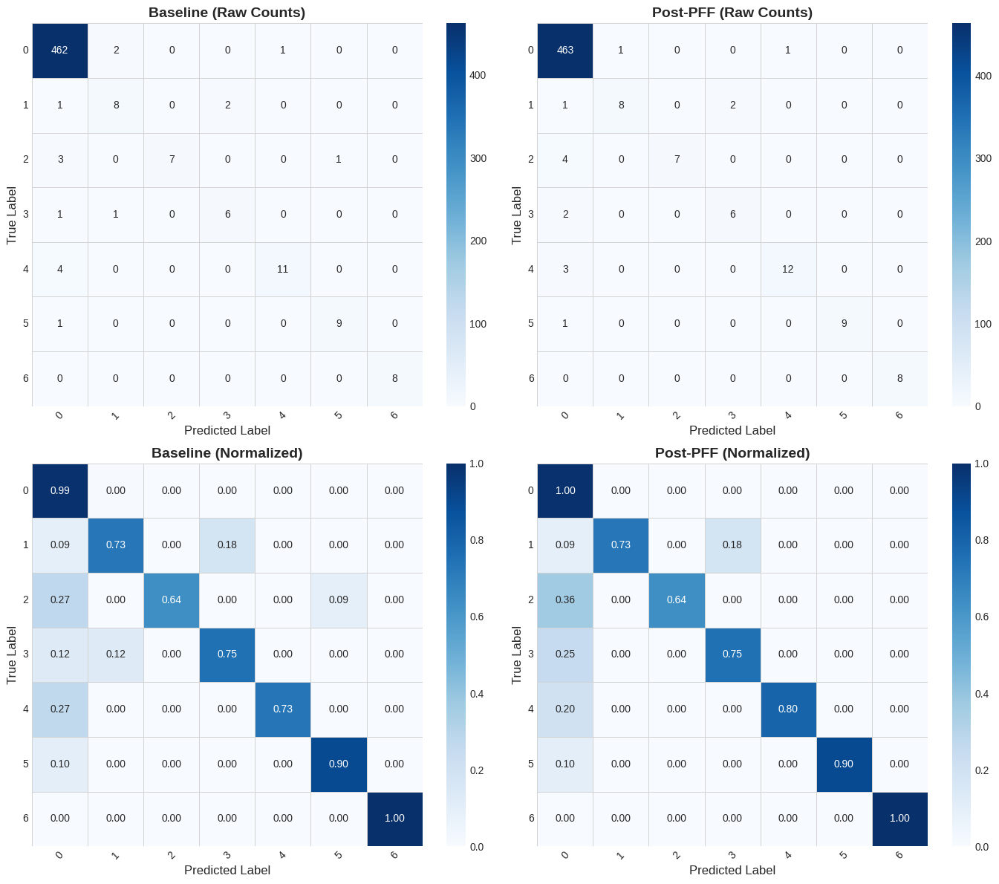


=== MÉTRICAS POR CLASSE (PATCH-LEVEL) ===
Class              | Raw F1 (%)   | PFF F1 (%)   | Delta   
good               |      98.61% |      98.62% |   +0.00%
broken end         |      72.73% |      80.00% |   +7.27%
hole               |      77.78% |      77.78% |   +0.00%
netting multiple   |      75.00% |      75.00% |   +0.00%
thick bar          |      81.48% |      85.71% |   +4.23%
thin bar           |      90.00% |      94.74% |   +4.74%
knots              |     100.00% |     100.00% |   +0.00%
------------------------------------------------------------
All Classes        |      85.09% |      87.41% |   +2.32%



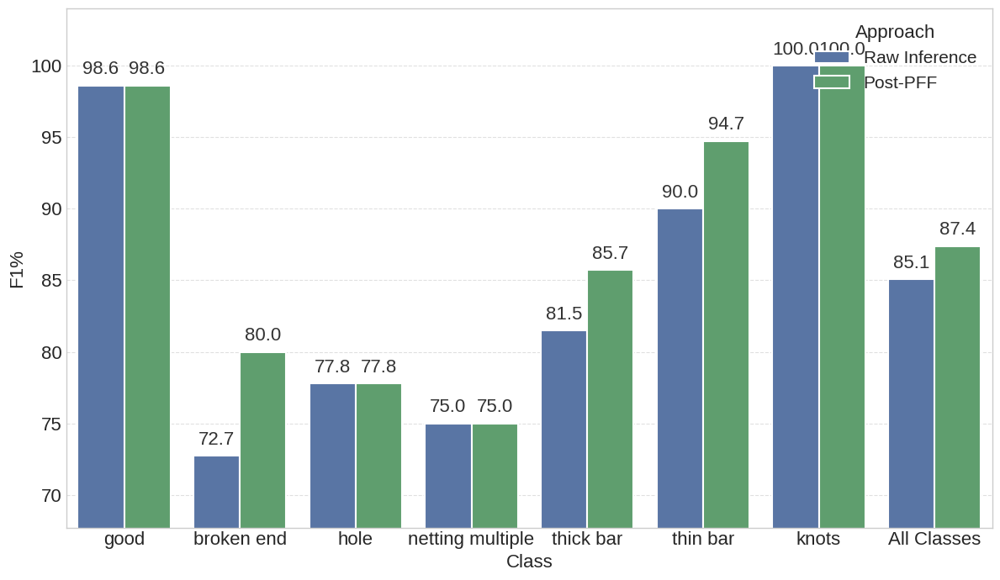


=== GERANDO VISUALIZAÇÃO QUALITATIVA (RECONSTRUÇÃO CORRIGIDA) ===
[INFO] Encontradas 16 imagens com defeito real.


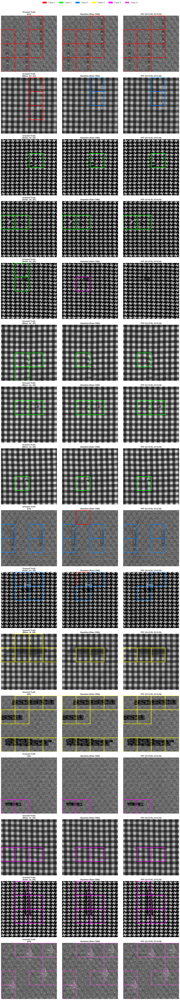

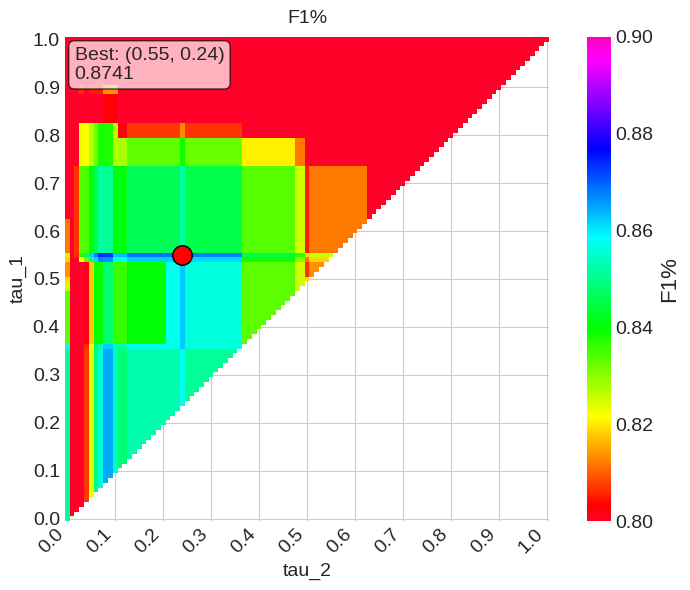

In [29]:
set_seed(CFG.SEED)

run_pff_experiment(model_path='/kaggle/input/models/angelogoes/patch-tau-study/pytorch/default/1/mobilenetv3-ce-und5-p64-hku-fold0(1).pth', 
                   val_csv_path='/kaggle/input/datasets/angelogoes/patch-tau-study-splits/master_splits_64_hku.csv', 
                   fold=0, 
                   model_name='mobilenetv3_large_150d.ra4_e3600_r256_in1k',
                   patch_size=64,
                   tau_range=tau_range)

csv_path = "./statistics/pff_results/pff_metrics_grid_fold0.csv"
metric_names = ["patch_f1_macro"]

plot_tau_heatmaps_from_csv(csv_path,metric_names,vmin=0.80, vmax=0.90)

[INFO] Random seed set as 42

=== AVALIAÇÃO PFF & SEGMENTAÇÃO: FOLD 3 | MODELO: mobilenetv3_large_150d.ra4_e3600_r256_in1k ===
[INFO] Loading timm model: 'mobilenetv3_large_150d.ra4_e3600_r256_in1k' (Pretrained: True)...


[INFO] Successfully initialized mobilenetv3_large_150d.ra4_e3600_r256_in1k with 7 output classes.
[INFO] Created Eval transforms. Target size: 256, Interpolation: bilinear
[INFO] Caching 528 images to RAM. Please wait...


  0%|          | 0/528 [00:00<?, ?it/s]


[INFO] Construindo Cache Base na RAM (528 patches)...

[INFO] Pré-carregando máscaras GT para 33 imagens base...

[INFO] --- RESULTADOS BASELINE (Sem PFF) ---
  [Métricas de Patch]
    patch_acc_multi: 0.9697
    patch_f1_macro: 0.8317
    patch_pre_macro: 0.8719
    patch_rec_macro: 0.8068
    patch_f1_weighted: 0.9679
    patch_pre_weighted: 0.9685
    patch_rec_weighted: 0.9697
    patch_f1_micro: 0.9697
    patch_acc_bin: 0.9848
    patch_f1_bin: 0.9245
    patch_pre_bin: 1.0
    patch_rec_bin: 0.8596
  [Métricas de Segmentação/Imagem]
    pixel_iou_mean: 0.5028
    pixel_f1_mean: 0.5185
    region_iou_mean: 0.5907
    region_f1_mean: 0.647
    img_sensitivity: 0.9412
    img_specificity: 1.0
    img_accuracy: 0.9697
--------------------------------------------------

[INFO] Iniciando Grid Search Rápido (5151 iterações)...


Grid PFF:   0%|          | 0/5151 [00:00<?, ?comb/s]


[SUCESSO] Grid Search concluído. Salvo em: ./statistics/pff_results/pff_metrics_grid_fold3.csv

=== AVALIAÇÃO PROFUNDA DOS CAMPEÕES ===

[Campeão em patch_f1_macro] -> tau_1: 0.49, tau_2: 0.06 (Score: 0.8637)
  [Métricas de Patch - Pós PFF]
    patch_acc_multi: 0.9735
    patch_f1_macro: 0.8637
    patch_pre_macro: 0.8891
    patch_rec_macro: 0.8613
    patch_f1_weighted: 0.9734
    patch_pre_weighted: 0.9759
    patch_rec_weighted: 0.9735
    patch_f1_micro: 0.9735
    patch_acc_bin: 0.9848
    patch_f1_bin: 0.9273
    patch_pre_bin: 0.9623
    patch_rec_bin: 0.8947
  [Métricas de Segmentação/Imagem]
    pixel_iou_mean: 0.5031
    pixel_f1_mean: 0.5191
    region_iou_mean: 0.6006
    region_f1_mean: 0.6584
    img_sensitivity: 0.9412
    img_specificity: 1.0
    img_accuracy: 0.9697
  [Δ em relação à Baseline]
    patch_acc_multi: +0.0038 ↑
    patch_f1_macro: +0.0320 ↑
    patch_pre_macro: +0.0172 ↑
    patch_rec_macro: +0.0545 ↑
    patch_f1_weighted: +0.0055 ↑
    patch_pre_weight

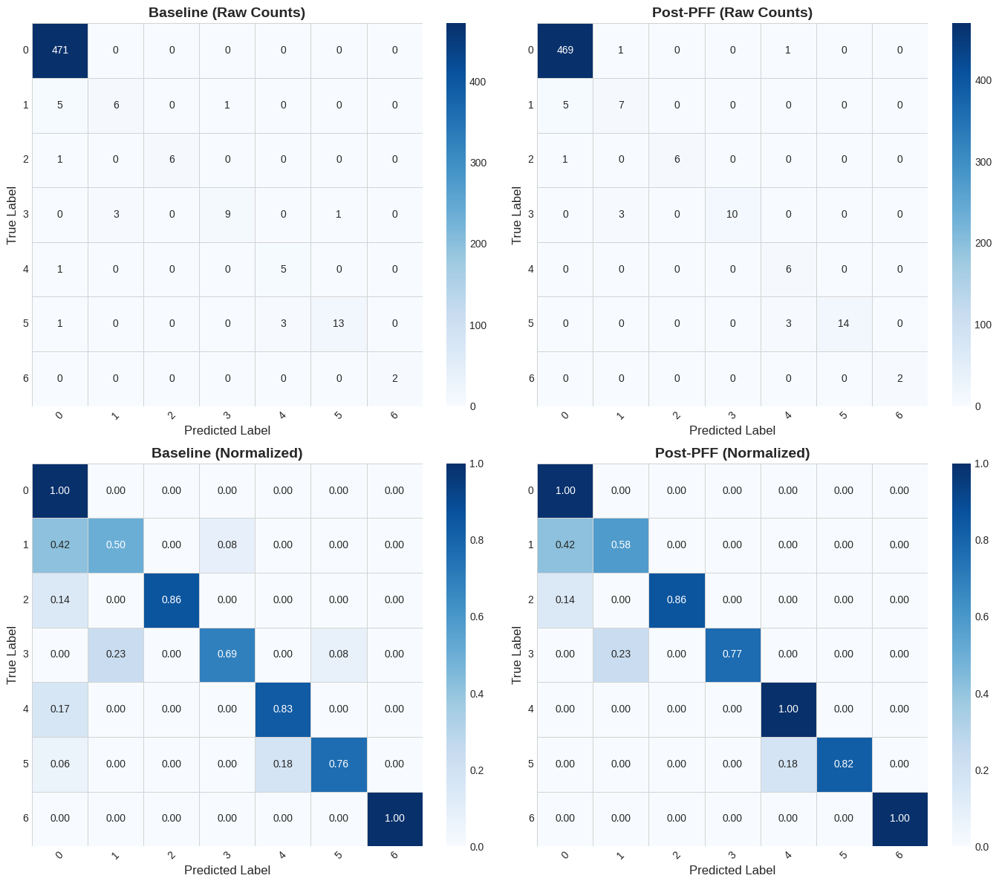


=== MÉTRICAS POR CLASSE (PATCH-LEVEL) ===
Class              | Raw F1 (%)   | PFF F1 (%)   | Delta   
good               |      99.16% |      99.15% |   -0.00%
broken end         |      57.14% |      60.87% |   +3.73%
hole               |      92.31% |      92.31% |   +0.00%
netting multiple   |      78.26% |      86.96% |   +8.70%
thick bar          |      71.43% |      75.00% |   +3.57%
thin bar           |      83.87% |      90.32% |   +6.45%
knots              |     100.00% |     100.00% |   +0.00%
------------------------------------------------------------
All Classes        |      83.17% |      86.37% |   +3.21%



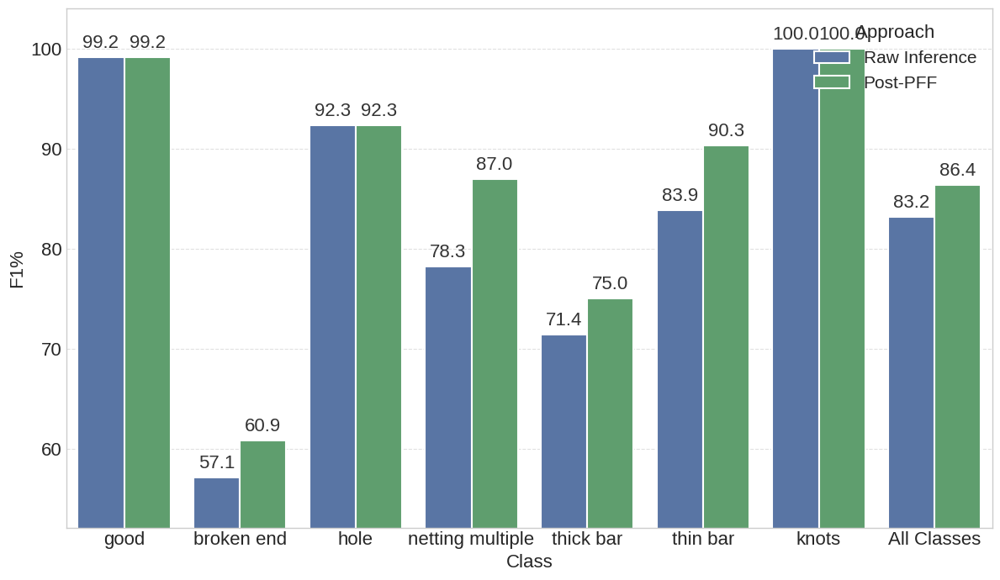


=== GERANDO VISUALIZAÇÃO QUALITATIVA (RECONSTRUÇÃO CORRIGIDA) ===
[INFO] Encontradas 17 imagens com defeito real.


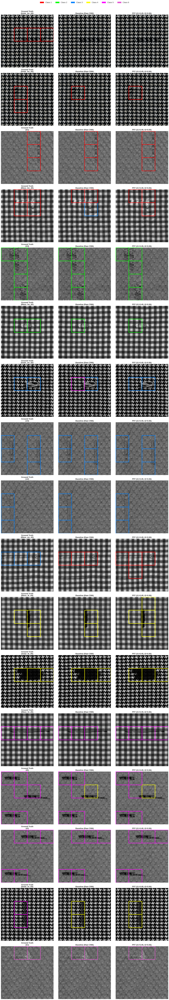

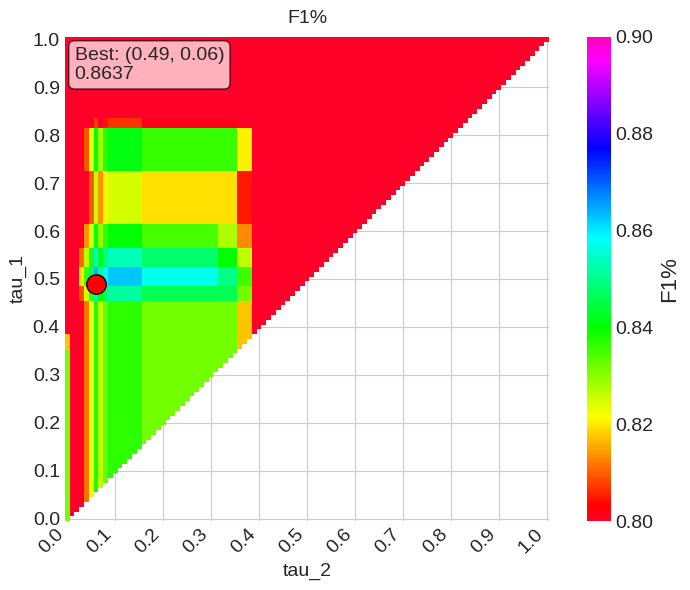

In [30]:
set_seed(CFG.SEED)

run_pff_experiment(model_path='/kaggle/input/models/angelogoes/patch-tau-study/pytorch/default/1/mobilenetv3-ce-p64-hku-fold3(4).pth', 
                   val_csv_path='/kaggle/input/datasets/angelogoes/patch-tau-study-splits/master_splits_64_hku.csv', 
                   fold=3, 
                   model_name='mobilenetv3_large_150d.ra4_e3600_r256_in1k',
                   patch_size=64,
                   tau_range=tau_range)

csv_path = "./statistics/pff_results/pff_metrics_grid_fold3.csv"
metric_names = ["patch_f1_macro"]

plot_tau_heatmaps_from_csv(csv_path,metric_names)

In [31]:
# set_seed(CFG.SEED)

# run_pff_experiment(model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/1/mobilenetv3_p128_und5_tilda_e50_fold2.pth', 
#                    val_csv_path='/kaggle/input/datasets/angelogoes/tilda-splits/master_splits_128.csv', 
#                    fold=2, 
#                    model_name='mobilenetv3_large_150d.ra4_e3600_r256_in1k',
#                    patch_size=128,
#                    tau_range=tau_range)

# csv_path = "./statistics/pff_results/pff_metrics_grid_fold2.csv"
# metric_names = ["patch_f1_macro"]

# plot_tau_heatmaps_from_csv(csv_path,metric_names)

In [32]:
# set_seed(CFG.SEED)

# run_pff_experiment(model_path='/kaggle/input/models/angelogoes/hku-models/pytorch/default/1/mobilenetv3_und5_p128.pth', 
#                    val_csv_path='/kaggle/input/datasets/angelogoes/hku-splits/master_splits_128.csv', 
#                    fold=4, 
#                    model_name='mobilenetv3_large_150d.ra4_e3600_r256_in1k', 
#                    patch_size=128,
#                    tau_range=tau_range)

# csv_path = "./statistics/pff_results/pff_metrics_grid_fold4.csv"
# metric_names = ["patch_f1_macro"]

# plot_tau_heatmaps_from_csv(csv_path,metric_names)

In [33]:
# Tente importar o torch_tensorrt (necessário para o backend 'tensorrt')
# try:
#     import torch_tensorrt
#     HAS_TRT = True
# except ImportError:
#     HAS_TRT = False
#     print("[AVISO] torch_tensorrt não encontrado. O compile usará o backend padrão.")

def fast_pff(probs, tau_1, tau_2):
    """
    probs: tensor [H, W, C] (já na GPU)
    Classe 0 = 'good'
    """

    H, W, C = probs.shape

    # -------------------------
    # Passo 1 — Tau1
    # -------------------------
    pred_conf, pred_class = torch.max(probs, dim=2)

    final_map = pred_class.clone()

    mask_tau1 = (pred_class != 0) & (pred_conf < tau_1)
    final_map[mask_tau1] = 0

    # -------------------------
    # Passo 2 — Expansão vetorizada
    # -------------------------

    # kernel 3x3 para vizinhança 8-conectada
    kernel = torch.ones((1, 1, 3, 3), device=probs.device)

    changed = True

    while changed:
        prev_map = final_map.clone()

        for cls in range(1, C):
            class_mask = (final_map == cls).float().unsqueeze(0).unsqueeze(0)
            dilated = F.conv2d(class_mask, kernel, padding=1) > 0
            grow_mask = (final_map == 0) & dilated.squeeze() & (probs[..., cls] > tau_2)
            final_map[grow_mask] = cls

        changed = not torch.equal(prev_map, final_map)

    return final_map

def run_pipeline_speed_benchmark(
    model_path,
    model_name='fastvit_t8.apple_in1k',
    patch_size=64,
    image_height=256,
    image_width=4096,
    tau_1=0.5,
    tau_2=0.7,
    num_runs=20,
    warmup_runs=5,
    inference_batch_size=256,
    use_fp16=True,
    use_compile=True,
    use_multiple_gpu=False
):
    """
    Benchmark otimizado do pipeline completo.
    """

    device = CFG.DEVICE

    print(f"\n{'='*70}")
    print(f"=== BENCHMARK PIPELINE COMPLETO | MODELO: {model_name} ===")
    print(f"{'='*70}")
    print(f"Imagem: {image_height}x{image_width}")
    print(f"Patch size: {patch_size}")
    print(f"Tau1={tau_1} | Tau2={tau_2}")
    print(f"Runs: {num_runs} (warmup={warmup_runs})")
    print(f"FP16: {use_fp16} | Compile: {use_compile}")

    # 🔥 ALTERADO: ativar autotune do cuDNN
    if device == "cuda":
        torch.backends.cudnn.benchmark = True

    # -------------------------
    # Carrega modelo
    # -------------------------
    checkpoint = torch.load(model_path, map_location=device)

    model = get_timm_model(
        model_name=model_name,
        num_classes=len(CURRENT_CLASSES),
        device=device
    )

    model.load_state_dict(checkpoint)
    model.eval()

    # 🔥 ALTERADO: FP16
    if use_fp16 and device == "cuda":
        model = model.half()

    # -------------------------
    # Gera imagem sintética fixa
    # -------------------------
    image = torch.randn(1, 3, image_height, image_width)

    if use_fp16 and device == "cuda":
        image = image.half()

    # Se a imagem chega na CPU, passe ela para a GPU *antes* do slicing
    if image.device.type != 'cuda':
        image = image.to(device, non_blocking=True)


    if use_compile:
        model = torch.compile(model, mode="reduce-overhead")

    n_patches_h = image_height // patch_size
    n_patches_w = image_width // patch_size
    total_patches = n_patches_h * n_patches_w

    print(f"Patches: {n_patches_h} x {n_patches_w} = {total_patches}")

    preprocessing_times = []
    inference_times = []
    postprocessing_times = []
    total_times = []

    # Descobre o tamanho do output (ex: número de classes)
    num_classes = len(CURRENT_CLASSES)

    for run in range(num_runs):

        # =========================
        # FASE 1 — PREPROCESSAMENTO
        # =========================
        if device == "cuda":
            torch.cuda.synchronize()

        t0 = time.perf_counter()
        
        # Faz o slicing direto na memória da GPU
        # Evite o .contiguous() se a sua rede suportar tensores não-contíguos na entrada 
        # (a maioria das CNNs/ViTs em PyTorch moderno suporta ou lida melhor internamente)
        
        patches = image.unfold(2, patch_size, patch_size)\
                       .unfold(3, patch_size, patch_size)\
                       .reshape(-1, 3, patch_size, patch_size) # reshape às vezes é mais rápido que view+contiguous


        if device == "cuda":
            torch.cuda.synchronize()

        t1 = time.perf_counter()

        # =========================
        # FASE 2 — INFERÊNCIA
        # =========================
        if device == "cuda":
            torch.cuda.synchronize()

        t2 = time.perf_counter()

        # 🔥 ALTERADO: usar inference_mode (mais rápido que no_grad)
        with torch.inference_mode():

            # 🔥 ALTERADO: se cabe tudo em 1 batch, remove loop Python
            if total_patches <= inference_batch_size:
                logits = model(patches)
            else:

                # DEPOIS (Otimizado):
                # Pré-aloca o tensor final vazio na GPU
                logits = torch.empty((total_patches, num_classes), dtype=torch.float16 if use_fp16 else torch.float32, device=device)
                
                for i in range(0, total_patches, inference_batch_size):
                    end = min(i + inference_batch_size, total_patches)
                    # Preenche o tensor diretamente sem fazer o concat depois
                    logits[i:end] = model(patches[i:end])

        if device == "cuda":
            torch.cuda.synchronize()

        t3 = time.perf_counter()

        # =========================
        # FASE 3 — PÓS-PROCESSAMENTO (PFF)
        # =========================
        if device == "cuda":
            torch.cuda.synchronize()

        t4 = time.perf_counter()

        # 🔥 ALTERADO: usar logits diretamente
        logits = logits.view(n_patches_h, n_patches_w, -1)

        final_map = fast_pff(logits, tau_1, tau_2)

        if device == "cuda":
            torch.cuda.synchronize()

        t5 = time.perf_counter()

        # =========================
        # Registrar tempos
        # =========================
        if run >= warmup_runs:
            preprocessing_times.append(t1 - t0)
            inference_times.append(t3 - t2)
            postprocessing_times.append(t5 - t4)
            total_times.append((t1 - t0) + (t3 - t2) + (t5 - t4))

    # =========================
    # Resultados finais
    # =========================
    def summarize(name, values):
        mean = np.mean(values)
        std = np.std(values)
        print(f"{name}: {mean*1000:.2f} ms ± {std*1000:.2f} ms")
        return mean, std
    
    print("\n===== RESULTADOS (por imagem) =====")
    
    mean_pre, std_pre = summarize("Preprocessing", preprocessing_times)
    mean_inf, std_inf = summarize("Inference", inference_times)
    mean_post, std_post = summarize("Post-processing (PFF)", postprocessing_times)
    mean_total, std_total = summarize("Total", total_times)
    
    throughput = 1 / mean_total
    print(f"\nThroughput médio: {throughput:.2f} imagens/seg")
    
    # =========================
    # 📊 Gráfico de barras
    # =========================
    
    phases = ['Preprocessing', 'Inference', 'Post-processing']
    
    mean_times_ms = np.array([
        mean_pre,
        mean_inf,
        mean_post
    ]) * 1000
    
    std_times_ms = np.array([
        std_pre,
        std_inf,
        std_post
    ]) * 1000
    
    colors = ['#4C72B0', '#55A868', '#C44E52']  # azul, verde, vermelho suave
    
    plt.figure(figsize=(10, 7))
    
    bars = plt.bar(
        phases,
        mean_times_ms,
        yerr=std_times_ms,
        capsize=6,
        color=colors
    )

    # 🔧 Padding superior interno
    max_bar = np.max(mean_times_ms + std_times_ms)
    plt.ylim(0, max_bar * 1.15)
    
    plt.title(
        f'Pipeline Execution Time per Image\n'
        f'Image Size: {image_width}x{image_height} | Patch Size: {patch_size}\n'
        f'N={num_runs-warmup_runs} valid runs | '
        f'Total: {mean_total*1000:.2f} ms | '
        f'Throughput: {throughput:.2f} img/s',
        pad=20
    )
    
    plt.ylabel('Mean Time (milliseconds)')
    plt.xlabel('Pipeline Phase')
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    
    # Adicionar valores e percentuais
    for i, bar in enumerate(bars):
    
        percentage = (
            mean_times_ms[i] / (mean_total * 1000) * 100
            if mean_total > 0 else 0
        )
    
        yval = bar.get_height()
    
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            yval + 0.5,
            f'{mean_times_ms[i]:.2f} ms\n({percentage:.1f}%)',
            ha='center',
            va='bottom',
            fontsize=9
        )
    
    plt.tight_layout()
    plt.show()


## TILDA

In [34]:
# set_seed(CFG.SEED)

# run_pff_experiment(model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/2/tilda-models-pytorch-default-v1/fastvit-ce-tilda64-e30.pth', 
#                    val_csv_path='/kaggle/input/datasets/angelogoes/tilda-splits/master_splits_64.csv', 
#                    fold=1, 
#                    model_name='fastvit_t8.apple_in1k', 
#                    patch_size=64,
#                    tau_range=tau_range)

# csv_path = "./statistics/pff_results/pff_metrics_grid_fold1.csv"
# metric_names = ["patch_f1_macro"]

# plot_tau_heatmaps_from_csv(csv_path,metric_names)

In [35]:
# set_seed(CFG.SEED)

# run_pff_experiment(model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/2/resnet50-tilda-ce-p64-e30.pth', 
#                    val_csv_path='/kaggle/input/datasets/angelogoes/tilda-splits/master_splits_64.csv', 
#                    fold=1, 
#                    model_name='resnet50.fb_swsl_ig1b_ft_in1k',
#                    patch_size=64,
#                    tau_range=tau_range)

# csv_path = "./statistics/pff_results/pff_metrics_grid_fold1.csv"
# metric_names = ["patch_f1_macro"]

# plot_tau_heatmaps_from_csv(csv_path,metric_names)

In [36]:
# set_seed(CFG.SEED)

# run_pff_experiment(model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/2/tilda-models-pytorch-default-v1/mobilenetv3-ce-tilda64-e30.pth', 
#                    val_csv_path='/kaggle/input/datasets/angelogoes/tilda-splits/master_splits_64.csv', 
#                    fold=1, 
#                    model_name='mobilenetv3_large_150d.ra4_e3600_r256_in1k',
#                    patch_size=64,
#                    tau_range=tau_range)

# csv_path = "./statistics/pff_results/pff_metrics_grid_fold1.csv"
# metric_names = ["patch_f1_macro"]

# plot_tau_heatmaps_from_csv(csv_path,metric_names)

## SPEED

In [37]:
# set_seed(CFG.SEED)

# run_pipeline_speed_benchmark(
#                     model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/2/tilda-models-pytorch-default-v1/fastvit-ce-tilda64-e30.pth', 
#                     model_name='fastvit_t8.apple_in1k',
#                     patch_size=64,
#                     image_height=2048,
#                     image_width=10240,
#                     tau_1=0.8,
#                     tau_2=0.1,
#                     num_runs=20,
#                     warmup_runs=5,
#                     inference_batch_size=1024,
# )

In [38]:
# set_seed(CFG.SEED)

# run_pipeline_speed_benchmark(
#                     model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/2/resnet50-tilda-ce-p64-e30.pth', 
#                     model_name='resnet50.fb_swsl_ig1b_ft_in1k',
#                     patch_size=64,
#                     image_height=2048,
#                     image_width=10240,
#                     tau_1=0.8,
#                     tau_2=0.1,
#                     num_runs=20,
#                     warmup_runs=5,
#                     inference_batch_size=1024,
# )

In [39]:
# set_seed(CFG.SEED)

# run_pipeline_speed_benchmark(
#                     model_path='/kaggle/input/models/angelogoes/tilda-models/pytorch/default/2/tilda-models-pytorch-default-v1/mobilenetv3-ce-tilda64-e30.pth', 
#                     model_name='mobilenetv3_large_150d.ra4_e3600_r256_in1k',
#                     patch_size=64,
#                     image_height=2048,
#                     image_width=10240,
#                     tau_1=0.8,
#                     tau_2=0.1,
#                     num_runs=20,
#                     warmup_runs=5,
#                     inference_batch_size=1024,
# )